# draft

#### 1. 불러오기 & 데이터 정리

In [207]:
import pandas as pd

raw_df = pd.read_csv('./Fin.csv')
raw_df = raw_df.drop(['Unnamed: 0', '제목'], axis=1)

# '구독자수' 컬럼의 따옴표 제거
raw_df['구독자수'] = raw_df['구독자수'].str.replace(",", "")
raw_df['구독자수'] = pd.to_numeric(raw_df['구독자수'], errors='coerce') # # '구독자수' 컬럼의 데이터를 숫자로 변환

raw_df

,출연자,회차,조회수,좋아요수,댓글수,재생시간(초),구독자수,term,시청률,직업,성별,나이,수상여부,인지도
0,나영석,40,881349,6186,224,314,0,1290,2.600,서비스,M,중년,Y,Y
1,이명진,40,173,1,1,109,0,1290,2.600,서비스,M,청년,N,N
2,김부연,41,593,4,1,394,0,1290,2.700,기타,F,중년,N,N
3,김유자,41,593,4,1,394,0,1290,2.700,기타,F,청년,N,N
4,김만순,41,593,4,1,394,0,1290,2.700,기타,F,노년,N,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
830,유연수,228,204607,2509,414,983,894000,29,4.912,운동선수,M,청년,Y,Y
831,박인비,228,81779,500,36,501,894000,29,4.912,운동선수,F,청년,Y,Y
832,김영옥,229,508075,5183,186,1044,897000,22,4.468,연예인,F,노년,Y,Y
833,나문희,229,508075,5183,186,1044,897000,22,4.468,연예인,F,노년,Y,Y


#### 2. labelencoding

In [180]:
labelEn_df = raw_df.copy()

#-------------------------------------------------------------------------------------

job = labelEn_df['직업'].unique()
sex = labelEn_df['성별'].unique()
age = labelEn_df['나이'].unique()
awr = labelEn_df['수상여부'].unique()
pop = labelEn_df['인지도'].unique()
host = labelEn_df['출연자'].unique()

#-------------------------------------------------------------------------------------

from sklearn.preprocessing import LabelEncoder

# 직업
job_encoder = LabelEncoder()
labelEn_df['직업'] = job_encoder.fit_transform(labelEn_df['직업'])

# 성별
sex_encoder = LabelEncoder()
labelEn_df['성별'] = sex_encoder.fit_transform(labelEn_df['성별'])

# 나이
age_encoder = LabelEncoder()
labelEn_df['나이'] = age_encoder.fit_transform(labelEn_df['나이'])

# 수상여부
awr_encoder = LabelEncoder()
labelEn_df['수상여부'] = awr_encoder.fit_transform(labelEn_df['수상여부'])

# 인지도
pop_encoder = LabelEncoder()
labelEn_df['인지도'] = pop_encoder.fit_transform(labelEn_df['인지도'])

# 출연자
host_encoder = LabelEncoder()
labelEn_df['출연자'] = host_encoder.fit_transform(labelEn_df['출연자'])

# 각각의 라벨 인코딩 값 출력
print(f"직업(Label Encoding): {dict(zip(job, job_encoder.transform(job)))}")
print(f"성별(Label Encoding): {dict(zip(sex, sex_encoder.transform(sex)))}")
print(f"나이(Label Encoding): {dict(zip(age, age_encoder.transform(age)))}")
print(f"수상여부(Label Encoding): {dict(zip(awr, awr_encoder.transform(awr)))}")
print(f"인지도(Label Encoding): {dict(zip(pop, pop_encoder.transform(pop)))}")
print(f"출연자(Label Encoding): {dict(zip(host, host_encoder.transform(host)))}")

labelEn_df

직업(Label Encoding): {'서비스': 3, '기타': 0, '산업': 2, '전문기술': 7, '운동선수': 6, '예술인': 5, '연예인': 4, '사회복지': 1, '학생': 8}
성별(Label Encoding): {'M': 1, 'F': 0}
나이(Label Encoding): {'중년': 2, '청년': 3, '노년': 0, '어린이': 1, '청소년': 4}
수상여부(Label Encoding): {'Y': 1, 'N': 0}
인지도(Label Encoding): {'Y': 1, 'N': 0}
출연자(Label Encoding): {'나영석': 221, '이명진': 513, '김부연': 103, '김유자': 160, '김만순': 88, '전정자': 641, '강충구': 20, '김정순': 174, '한정석': 767, '홍보민': 782, '길태후': 58, '길흥순': 59, '서담희': 335, '세나': 353, '남숙현': 226, '김기숙': 69, '임재윤': 611, '이규형': 493, '김범준': 101, '최연애': 730, '고대영': 25, '고석교': 27, '김현지': 210, '김현이': 209, '이태석': 590, '정대례': 648, '김슬기': 127, '서명옥': 338, '함범녀': 771, '배용호': 313, '이동훈': 510, '이지연': 582, '강미연': 9, '차금덕': 718, '신덕순': 378, '김한슬': 205, '김건태': 63, '최자영': 736, '최희화': 743, '김지헌': 183, '최정희': 738, '신원호': 386, '김대주': 78, '김란주': 86, '정종연': 668, '이명한': 515, '이윤수': 555, '이준서': 577, '김민주': 98, '박영서': 287, '박서현': 279, '오동고 프란시스 응고메 오켈로': 431, '재재': 636, '장명숙': 625, '박지선': 298, '유성호': 459, '표창원': 756, '진용

,출연자,회차,조회수,좋아요수,댓글수,재생시간(초),구독자수,term,시청률,직업,성별,나이,수상여부,인지도
0,221,40,881349,6186,224,314,0,1290,2.600,3,1,2,1,1
1,513,40,173,1,1,109,0,1290,2.600,3,1,3,0,0
2,103,41,593,4,1,394,0,1290,2.700,0,0,2,0,0
3,160,41,593,4,1,394,0,1290,2.700,0,0,3,0,0
4,88,41,593,4,1,394,0,1290,2.700,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
830,462,228,204607,2509,414,983,894000,29,4.912,6,1,3,1,1
831,291,228,81779,500,36,501,894000,29,4.912,6,0,3,1,1
832,140,229,508075,5183,186,1044,897000,22,4.468,4,0,0,1,1
833,220,229,508075,5183,186,1044,897000,22,4.468,4,0,0,1,1


In [181]:
labelEn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 835 entries, 0 to 834
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   출연자      835 non-null    int32  
 1   회차       835 non-null    int64  
 2   조회수      835 non-null    int64  
 3   좋아요수     835 non-null    int64  
 4   댓글수      835 non-null    int64  
 5   재생시간(초)  835 non-null    int64  
 6   구독자수     835 non-null    int64  
 7   term     835 non-null    int64  
 8   시청률      835 non-null    float64
 9   직업       835 non-null    int32  
 10  성별       835 non-null    int32  
 11  나이       835 non-null    int32  
 12  수상여부     835 non-null    int32  
 13  인지도      835 non-null    int32  
dtypes: float64(1), int32(6), int64(7)
memory usage: 71.9 KB


#### 3. 시청률 파헤치기

###### 한글패치

In [170]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# 한글 패치
# Matlab 한글 시 실행 코드
from matplotlib import font_manager, rc
import platform
import matplotlib.pyplot as plt

plt.rcParams['axes.unicode_minus'] = False

if platform.system() == 'Darwin':
    rc('font', family='AppleGothic')
    print('Mac version')
elif platform.system() == 'Windows':
    path = "c:/Windows/Fonts/malgun.ttf"
    font_name = font_manager.FontProperties(fname=path).get_name()
    rc('font', family=font_name)
    print('Windows version')
elif platform.system() == 'Linux':
    path = "/usr/share/fonts/NanumFont/NanumGothicBold.ttf"
    font_name = font_manager.FontProperties(fname=path).get_name()
    plt.rc('font', family=font_name)
    print('Linux version')
else:
    print('Unknown system... sorry~~~~')

Windows version


####  시청률 DF

In [171]:
view_df = labelEn_df.copy()

print(view_df.columns)

Index(['출연자', '회차', '조회수', '좋아요수', '댓글수', '재생시간(초)', '구독자수', 'term', '시청률',
       '직업', '성별', '나이', '수상여부', '인지도'],
      dtype='object')


피어슨 상관 히트맵 그리기
- 조회수, 좋아요수, 댓글수, 구독자수 <-> 시청률

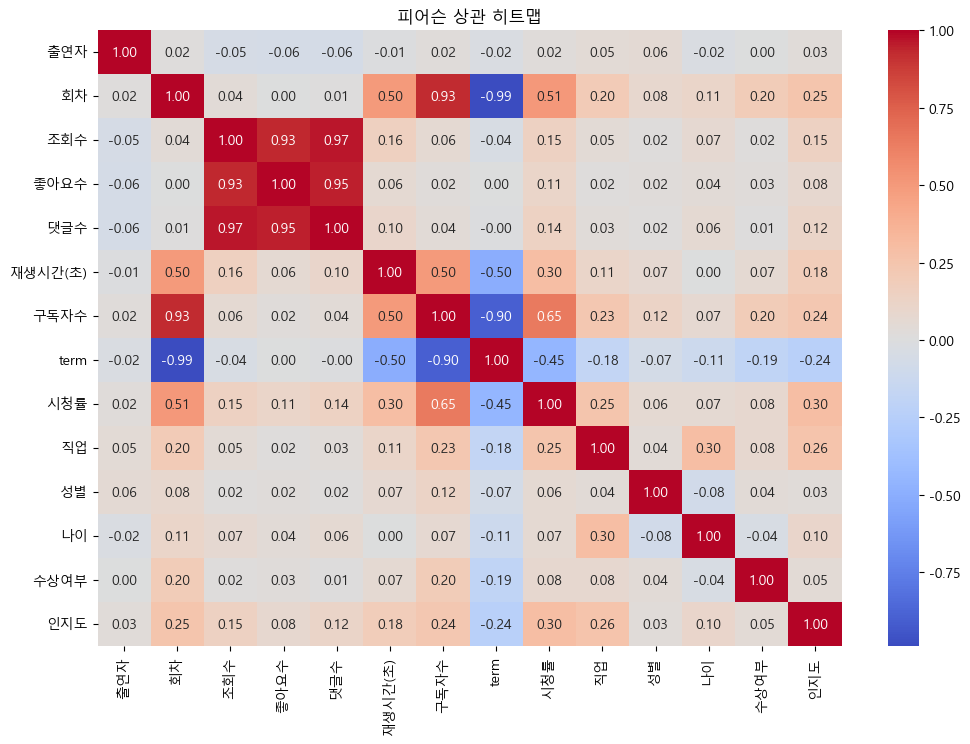

In [172]:
import seaborn as sns
import matplotlib.pyplot as plt

# 피어슨 상관 히트맵 그리기
plt.figure(figsize=(12, 8))
correlation_matrix = view_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('피어슨 상관 히트맵')
plt.show()


StandardScaler & 히스토그램
- 잘 알기 어려움

In [173]:
view_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 835 entries, 0 to 834
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   출연자      835 non-null    int32  
 1   회차       835 non-null    int64  
 2   조회수      835 non-null    int64  
 3   좋아요수     835 non-null    int64  
 4   댓글수      835 non-null    int64  
 5   재생시간(초)  835 non-null    int64  
 6   구독자수     835 non-null    int64  
 7   term     835 non-null    int64  
 8   시청률      835 non-null    float64
 9   직업       835 non-null    int32  
 10  성별       835 non-null    int32  
 11  나이       835 non-null    int32  
 12  수상여부     835 non-null    int32  
 13  인지도      835 non-null    int32  
dtypes: float64(1), int32(6), int64(7)
memory usage: 71.9 KB


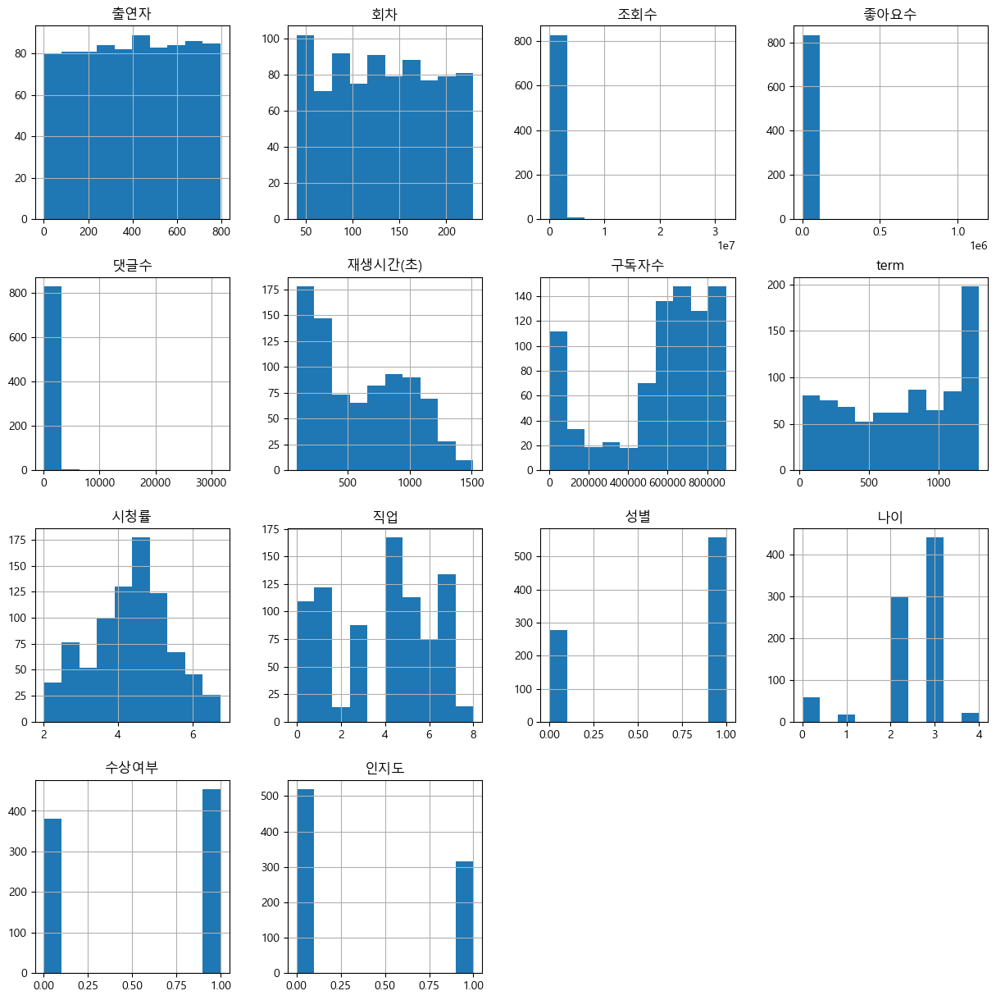

In [174]:
# StandardScaler를 사용하여 모든 컬럼의 스케일을 맞춤
from sklearn.preprocessing import StandardScaler

X = view_df[['출연자', '회차', '조회수', '좋아요수', '댓글수', '재생시간(초)', '구독자수', 'term', '직업', '성별', '나이', '수상여부', '인지도']]
y = view_df['시청률']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
labelEn_df_scaled = pd.DataFrame(X_scaled, columns=X.columns)  # NumPy 배열을 DataFrame으로 변환

#---------------------------------------------------

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=13)

#---------------------------------------------------

import matplotlib.pyplot as plt
%matplotlib inline

view_df.hist(bins=10, figsize=(15,15))
plt.show()

#### feature 특성 파악
- 각 시청률에 대한 중앙값(median) 계산

In [175]:
column_names = ['출연자', '회차', '조회수', '좋아요수', '댓글수', '재생시간(초)', '구독자수', 'term', '직업', '성별', '나이', '수상여부', '인지도']
df_pivot_table = view_df.pivot_table(column_names, ['시청률'], aggfunc='median')
print(df_pivot_table)

       term    구독자수   나이      댓글수   성별  수상여부  인지도  재생시간(초)         조회수  \
시청률                                                                      
2.009  1290       0  3.0      5.0  1.0   0.0  0.0    406.0      3323.0   
2.095  1290       0  3.0      1.0  0.0   1.0  1.0    216.0      2871.0   
2.174  1275   40000  1.0    163.5  1.0   0.5  0.0    387.5     82314.0   
2.200  1290       0  3.0      0.5  0.0   0.0  0.0    344.5      1838.5   
2.300  1271   60000  3.0      0.0  1.0   0.0  0.0    362.0       460.0   
...     ...     ...  ...      ...  ...   ...  ...      ...         ...   
6.537    99  871000  2.0   1389.5  1.0   0.5  0.5    856.0   1957254.5   
6.603   421  749074  3.0   1922.0  1.0   1.0  0.0    866.0   2321667.0   
6.711   902  594648  3.0     45.0  0.5   0.5  1.0    787.0     78470.0   
6.740  1052  534870  3.0  31668.0  1.0   1.0  1.0    797.0  32093523.0   
6.748   895  597139  3.0     74.0  1.0   0.0  1.0   1007.0    187647.0   

            좋아요수   직업    출연자   회차  
시

시청률에 대한 나머지 특성들의 관계
- 각 특성(컬럼) 간의 상관 계수 행렬을 계산하고, 시청률과의 상관 관계를 내림차순으로 정렬

In [176]:
corr_matrix = view_df.corr()
corr_matrix['시청률'].sort_values(ascending=False)

시청률        1.000000
구독자수       0.645201
회차         0.508568
재생시간(초)    0.300550
인지도        0.299638
직업         0.246597
조회수        0.151983
댓글수        0.139601
좋아요수       0.108543
수상여부       0.081240
나이         0.067235
성별         0.063221
출연자        0.024316
term      -0.449966
Name: 시청률, dtype: float64

Train '앙상블 전부 돌리기'

In [177]:
# ensemble(앙상블 기법) 에서 3가지 분류기 사용
from sklearn.ensemble import (AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier)

# 각 분류기 import
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression

# 빈 리스트 만들고
models = []

# 전부 append 시켜줌 (이름, 분류기 함수()) - 리스트으로 저장(리스트는 뭐든 들어가기 때문)
models.append(('RandomForestClassifier', RandomForestClassifier()))
models.append(('DecisionTreeClassifier', DecisionTreeClassifier()))
models.append(('AdaBoostClassifier', AdaBoostClassifier()))
models.append(('GradientBoostingClassifier', GradientBoostingClassifier()))
models.append(('LogisticRegression', LogisticRegression(solver='liblinear')))

models

[('RandomForestClassifier', RandomForestClassifier()),
 ('DecisionTreeClassifier', DecisionTreeClassifier()),
 ('AdaBoostClassifier', AdaBoostClassifier()),
 ('GradientBoostingClassifier', GradientBoostingClassifier()),
 ('LogisticRegression', LogisticRegression(solver='liblinear'))]

- 목표 변수(y_train)가 연속형(continuous) 값이라 오류 발생

- RandomForestClassifier: 약 0.70의 평균 정확도를 가지고 있으며, 표준편차는 약 0.04입니다.
- DecisionTreeClassifier: 약 0.68의 평균 정확도를 가지고 있으며, 표준편차는 약 0.05입니다.
- AdaBoostClassifier: 약 0.43의 평균 정확도를 가지고 있으며, 표준편차는 약 0.11입니다.
</br>(낮은 정확도와 높은 표준편차는 모델이 예측 성능이 안정적이지 않음)
- GradientBoostingClassifier: 약 0.79의 평균 정확도를 가지고 있으며, 표준편차는 약 0.02입니다.
- LogisticRegression: 약 0.52의 평균 정확도를 가지고 있으며, 표준편차는 약 0.02입니다.

In [178]:
# y_train이 현재 float 형태로 되어 있다면, 정수형(int)으로 변환
y_train = y_train.astype(int)

#-------------------------------------------------------------

from sklearn.model_selection import KFold, cross_val_score

results = []
names = []

for name, model in models:
    kfold = KFold(n_splits=5, random_state=13, shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train,
                                 cv=kfold, scoring='accuracy')
    results.append(cv_results)
    names.append(name)

    print(name, cv_results.mean(), cv_results.std())


KeyboardInterrupt: 

-  각 모델에 대한 5-fold 교차 검증의 정확도

In [ ]:
results

[array([0.73134328, 0.74626866, 0.69402985, 0.66165414, 0.65413534]),
 array([0.65671642, 0.71641791, 0.73134328, 0.58646617, 0.70676692]),
 array([0.53731343, 0.41791045, 0.40298507, 0.2481203 , 0.54887218]),
 array([0.82089552, 0.79850746, 0.78358209, 0.78195489, 0.76691729]),
 array([0.49253731, 0.50746269, 0.52985075, 0.54887218, 0.53383459])]

- GradientBoostingClassifier 가 가장 성능이 좋고, 그 다음은 RandomForestClassifier 

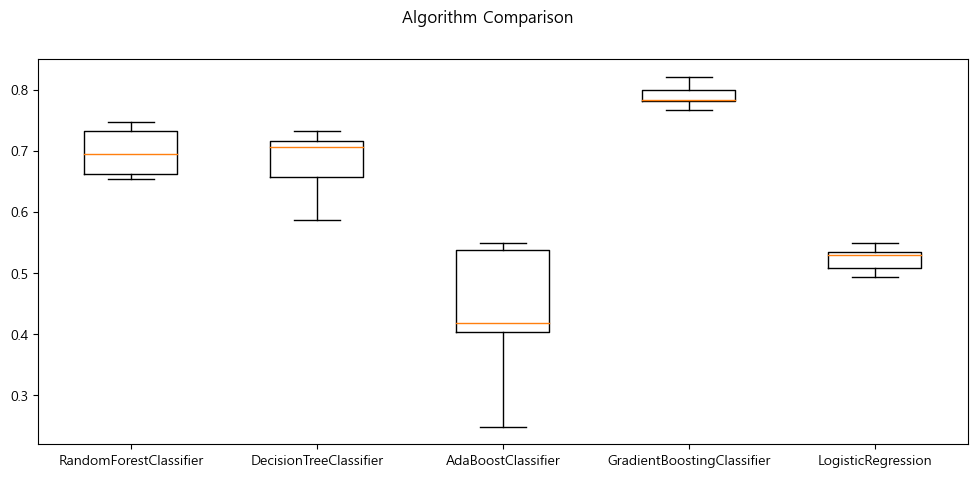

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(12, 5))
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

하이퍼파라미터 튜닝
- 튜닝한 모델을 사용하여 성능을 평가하고, 최종적으로 가장 성능이 우수한 모델을 선택하고자 함
- 너무 오래걸려서 포기함 🙄

In [ ]:
# from sklearn.model_selection import GridSearchCV

# # RandomForestClassifier 모델과 탐색할 하이퍼파라미터 설정
# param_grid = {
#     'n_estimators': [50, 100, 200],
#     'max_depth': [None, 10, 20],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 4]
# }

# # GridSearchCV를 사용하여 최적의 하이퍼파라미터 찾기
# grid_search = GridSearchCV(RandomForestClassifier(), param_grid, cv=5, scoring='accuracy')
# grid_search.fit(X_train, y_train)

# # 최적의 하이퍼파라미터 출력
# print("Best Hyperparameters for RandomForestClassifier:", grid_search.best_params_)


Best Hyperparameters for RandomForestClassifier: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


In [ ]:
# # GradientBoostingClassifier 모델과 탐색할 하이퍼파라미터 설정
# param_grid = {
#     'n_estimators': [50, 100, 200],
#     'learning_rate': [0.01, 0.1, 0.2],
#     'max_depth': [3, 5, 7],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 4]
# }

# # GridSearchCV를 사용하여 최적의 하이퍼파라미터 찾기
# grid_search = GridSearchCV(GradientBoostingClassifier(), param_grid, cv=5, scoring='accuracy')
# grid_search.fit(X_train, y_train)

# # 최적의 하이퍼파라미터 출력
# print("Best Hyperparameters for GradientBoostingClassifier:", grid_search.best_params_)

모델링

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

X = view_df[['출연자', '회차', '조회수', '좋아요수', '댓글수', '재생시간(초)', '구독자수', 'term', '직업', '성별', '나이', '수상여부', '인지도']]
y = view_df['시청률']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 데이터를 훈련 세트와 테스트 세트로 나누기
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=13)

# Gradient Boosting 모델 생성
gradient_boosting_model = GradientBoostingRegressor()

# 모델 훈련
gradient_boosting_model.fit(X_train, y_train)

# 테스트 데이터에 대한 예측
y_pred = gradient_boosting_model.predict(X_test)

# MSE 계산 : 값이 작을수록 모델의 예측이 실제 값과 가깝다
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

# R-squared 계산 : 최대값은 1이며, 1에 가까울수록 모델이 데이터를 잘 설명한다
r2 = r2_score(y_test, y_pred)
print("R-squared:", r2)


Mean Squared Error: 0.18978968969719767
R-squared: 0.8309623167276127


# Train #1

결론

1. Feature 선택 : 교수님으로 부터 얻을 수 있는 인적 자원을 먼저 분석해봄
- '시청률'을 예측하기 위해 사용한 특성(Feature)
- '회차': 영상의 회차 정보
- '직업': 업로더의 직업 정보
- '성별': 업로더의 성별 정보
- '나이': 업로더의 나이 정보

2. 사용한 모델
여러 모델을 실험하고 비교한 결과, 다양한 유형의 모델을 사용하여 앙상블(Stacking)하는 것이 성능 향상에 도움이 될 것으로 판단
사용한 개별 모델은 다음과 같음

- XGBoost Regressor
- LightGBM Regressor
- CatBoost Regressor
- AdaBoost Regressor
- Gradient Boosting Regressor
- RandomForest Regressor

3. 실험 및 스태킹
먼저, 각 개별 모델에 대한 실험을 진행하여 각 모델의 성능을 확인,각 모델이 어떤 특성에 민감하게 반응하는지, 어떤 모델이 더 우수한 예측을 하는지 등을 파악

---------

## 1. 데이터 전처리

### 상관 행렬 확인:
- 값을 보이는 term은 삭제를 고려해볼만함

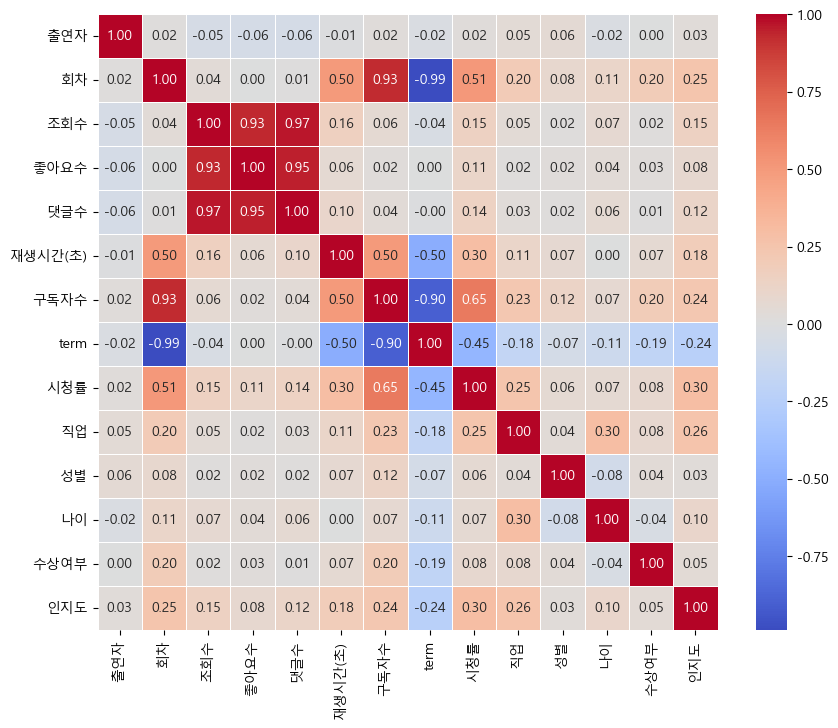

In [182]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 데이터프레임에서 상관 행렬 생성
correlation_matrix = labelEn_df.corr()

# 시각화
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5)
plt.show()


### VIF (Variance Inflation Factor) 확인
- 구독자수  51 > 회차  48 > 시청률  38 > 댓글수  21 > 조회수  18 

In [183]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# VIF 계산
def calculate_vif(data_frame):
    variables = data_frame.values
    vif_data = pd.DataFrame()
    vif_data["Variable"] = data_frame.columns
    vif_data["VIF"] = [variance_inflation_factor(variables, i) for i in range(variables.shape[1])]
    return vif_data

# VIF 확인
vif_results = calculate_vif(labelEn_df)
print(vif_results)


   Variable        VIF
0       출연자   4.101179
1        회차  48.435168
2       조회수  18.655879
3      좋아요수  11.537467
4       댓글수  21.410021
5   재생시간(초)   5.346479
6      구독자수  51.184534
7      term   9.968075
8       시청률  38.742139
9        직업   4.266527
10       성별   3.139487
11       나이   9.911113
12     수상여부   2.313429
13      인지도   1.948599


### 결측치 확인

In [184]:
# 결측치 확인
missing_columns = labelEn_df.columns[labelEn_df.isnull().any()].tolist()

# 결측치가 있는 열 출력
print("Columns with missing values:", missing_columns)

# 결측치가 있는 열 선택
X_missing = labelEn_df[missing_columns]

Columns with missing values: []


### 이상치(Outliers) 확인 & 처리
- 로그변환하고자 함

##### 상자 그림(Boxplot)

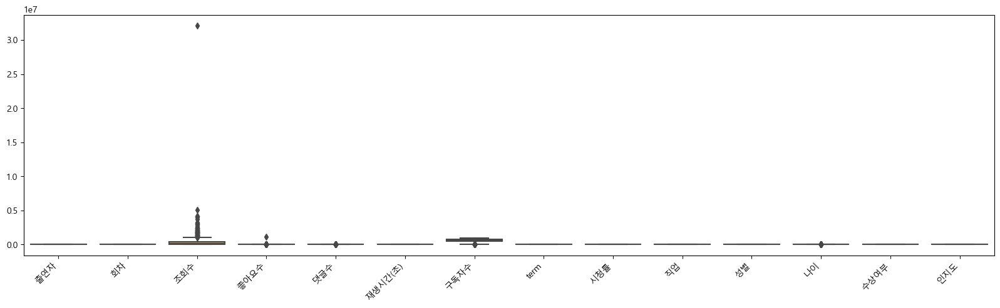

In [185]:
import seaborn as sns
import matplotlib.pyplot as plt

# 전체 데이터프레임에 대한 Boxplot
plt.figure(figsize=(20, 5))
sns.boxplot(data=labelEn_df)
plt.xticks(rotation=45, ha="right")
plt.show()


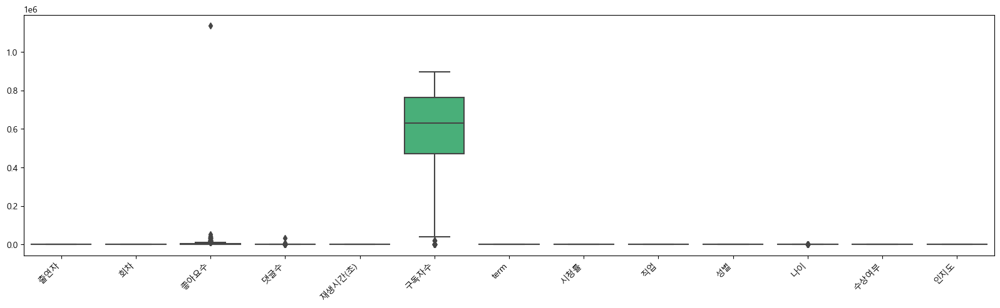

In [186]:
import seaborn as sns
import matplotlib.pyplot as plt

# '조회수' 컬럼을 제외한 나머지 컬럼에 대한 Boxplot
plt.figure(figsize=(20, 5))
sns.boxplot(data=labelEn_df.drop(columns=['조회수']))
plt.xticks(rotation=45, ha="right")
plt.show()


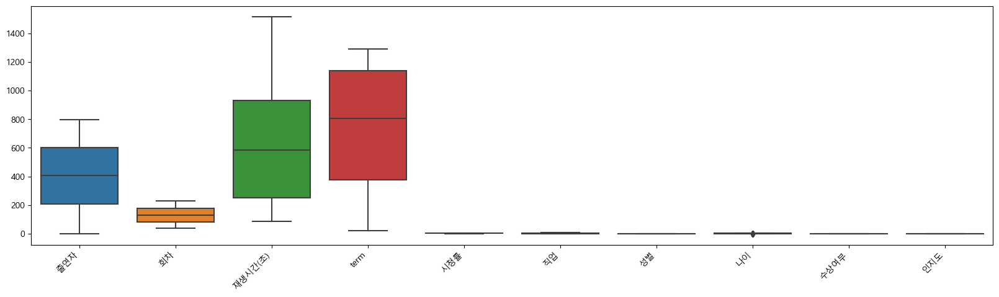

In [187]:
import seaborn as sns
import matplotlib.pyplot as plt

# '조회수' 컬럼을 제외한 나머지 컬럼에 대한 Boxplot
plt.figure(figsize=(20, 5))
sns.boxplot(data=labelEn_df.drop(columns=['조회수', '좋아요수', '구독자수', '댓글수']))
plt.xticks(rotation=45, ha="right")
plt.show()


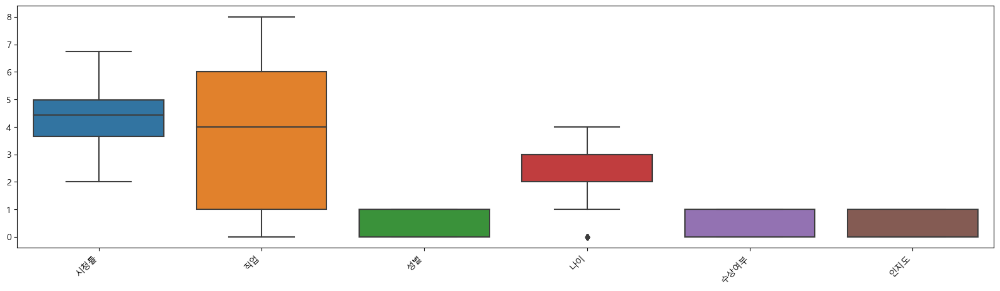

In [188]:
import seaborn as sns
import matplotlib.pyplot as plt

# '조회수' 컬럼을 제외한 나머지 컬럼에 대한 Boxplot
plt.figure(figsize=(20, 5))
sns.boxplot(data=labelEn_df.drop(columns=['조회수', '좋아요수', '구독자수', '댓글수', '출연자','회차','재생시간(초)','term']))
plt.xticks(rotation=45, ha="right")
plt.show()


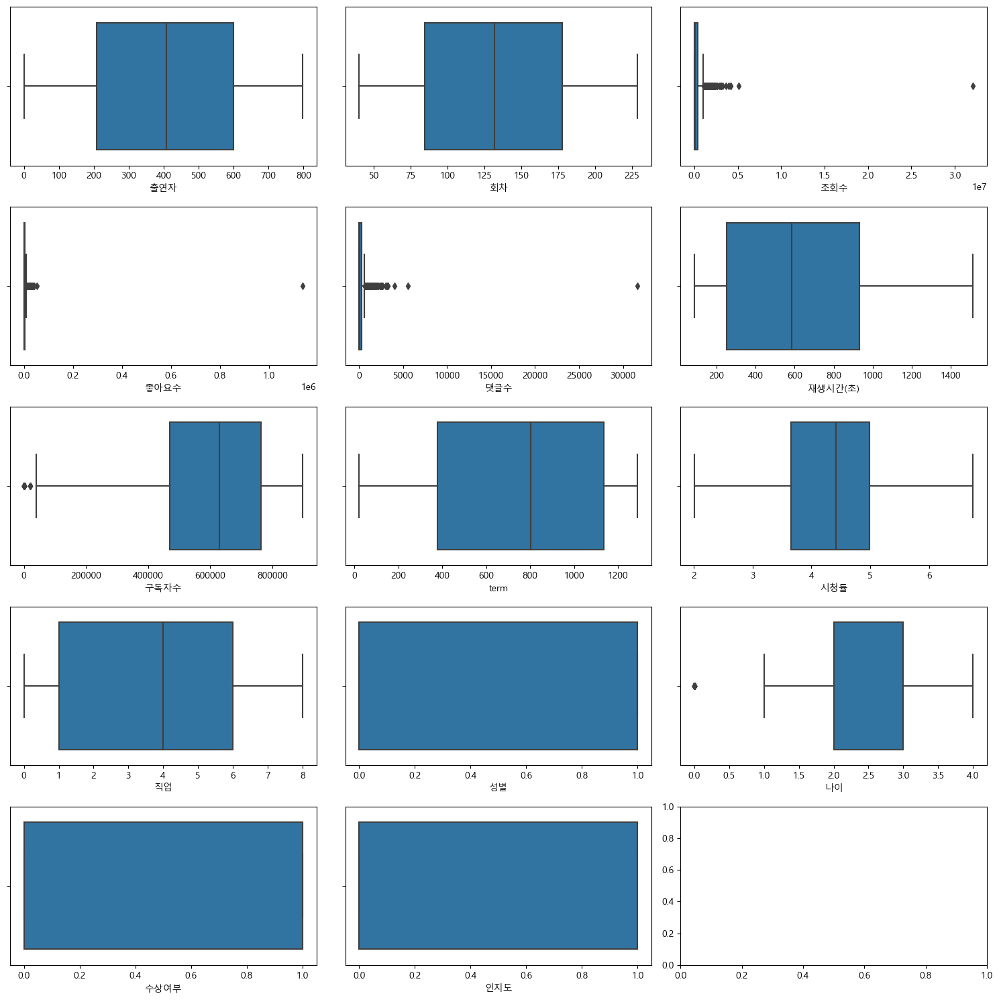

In [189]:
import seaborn as sns
import matplotlib.pyplot as plt

# 여러 변수에 대한 상자 그림
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 15))

for i, column in enumerate(labelEn_df):
    sns.boxplot(ax=axes[i//3, i%3], x=labelEn_df[column])

plt.tight_layout()
plt.show()


##### Z-스코어
- 각 데이터 포인트가 평균으로부터 얼마나 떨어져 있는지를 나타내는 표준화된 점수

In [190]:
from scipy import stats

z_scores = stats.zscore(labelEn_df['조회수'])
# 절대값이 3보다 큰 Z-스코어는 이상치로 간주할 수 있습니다.
outliers = np.where(np.abs(z_scores) > 3)

print("조회수 이상치:", outliers)

조회수 이상치: (array([173, 174, 192, 281], dtype=int64),)


In [191]:
from scipy import stats

z_scores = stats.zscore(labelEn_df['좋아요수'])
# 절대값이 3보다 큰 Z-스코어는 이상치로 간주할 수 있습니다.
outliers = np.where(np.abs(z_scores) > 3)

print("좋아요수 이상치 :", outliers)

좋아요수 이상치 : (array([281], dtype=int64),)


In [192]:
from scipy import stats

z_scores = stats.zscore(labelEn_df['댓글수'])
# 절대값이 3보다 큰 Z-스코어는 이상치로 간주할 수 있습니다.
outliers = np.where(np.abs(z_scores) > 3)

print("댓글수 이상치 :", outliers)

댓글수 이상치 : (array([152, 281, 604], dtype=int64),)


##### 이상치 처리 : Tukey's fences

In [193]:
import pandas as pd
import numpy as np

def remove_outliers_tukey(data, k=1.5):
    # 각 열에 대한 이상치 경계 계산
    Q1 = np.percentile(data, 25, axis=0)
    Q3 = np.percentile(data, 75, axis=0)
    IQR = Q3 - Q1
    lower_bound = Q1 - k * IQR
    upper_bound = Q3 + k * IQR
    
    # 이상치 제거
    without_outliers = data[(data >= lower_bound) & (data <= upper_bound)].dropna()
    
    return without_outliers

# '조회수', '좋아요수', '댓글수' 열에 대해 Tukey's fences 적용
columns_to_check = ['조회수', '좋아요수', '댓글수']

cl_labelEn_df = labelEn_df.copy()  # 기존 데이터프레임 복사

for column in columns_to_check:
    cl_labelEn_df[column] = remove_outliers_tukey(cl_labelEn_df[column])

# 결과 확인
cl_labelEn_df.describe()


,출연자,회차,조회수,좋아요수,댓글수,재생시간(초),구독자수,term,시청률,직업,성별,나이,수상여부,인지도
count,835.000000,835.000000,7.580000e+02,747.000000,739.000000,835.000000,835.000000,835.000000,835.000000,835.000000,835.000000,835.000000,835.000000,835.000000
mean,403.423952,132.117365,1.955962e+05,1818.512718,114.469553,607.853892,554568.071856,754.403593,4.335001,3.766467,0.667066,2.417964,0.543713,0.377246
std,229.571825,55.398518,2.474507e+05,2200.318507,144.018151,373.321006,276970.116425,411.182723,1.064374,2.393902,0.471546,0.867153,0.498384,0.484988
min,0.000000,40.000000,2.600000e+01,0.000000,0.000000,86.000000,0.000000,22.000000,2.009000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,207.500000,84.500000,1.676825e+04,211.500000,10.000000,251.500000,470000.000000,379.000000,3.659000,1.000000,0.000000,2.000000,0.000000,0.000000
50%,408.000000,132.000000,8.669500e+04,862.000000,55.000000,586.000000,629519.000000,804.000000,4.422000,4.000000,1.000000,3.000000,1.000000,0.000000
75%,600.500000,178.000000,2.758650e+05,2501.500000,168.000000,931.500000,764019.000000,1136.500000,4.988000,6.000000,1.000000,3.000000,1.000000,1.000000
max,797.000000,229.000000,1.033351e+06,9364.000000,617.000000,1514.000000,897000.000000,1290.000000,6.748000,8.000000,1.000000,4.000000,1.000000,1.000000


##### 이상치 처리 후 시각화

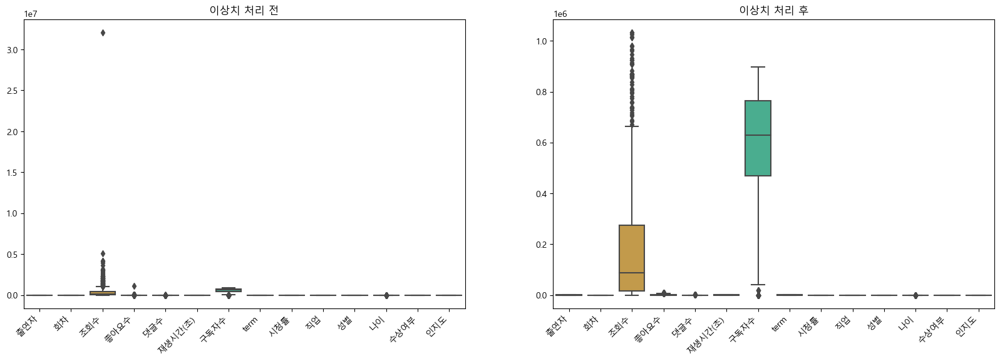

In [194]:
import matplotlib.pyplot as plt
import seaborn as sns

# 이상치 처리 전의 데이터
data_before = labelEn_df

# 이상치 처리 후의 데이터
data_after = cl_labelEn_df

# 상자 그림(Box Plot) 비교
plt.figure(figsize=(20, 6))
plt.subplot(1, 2, 1)
sns.boxplot(data=data_before)
plt.xticks(rotation=45, ha="right")
plt.title('이상치 처리 전')

plt.subplot(1, 2, 2)
sns.boxplot(data=data_after)
plt.xticks(rotation=45, ha="right")
plt.title('이상치 처리 후')

plt.show()


이전 히트맵 보다 눈에 띄게 연관성이 높아짐

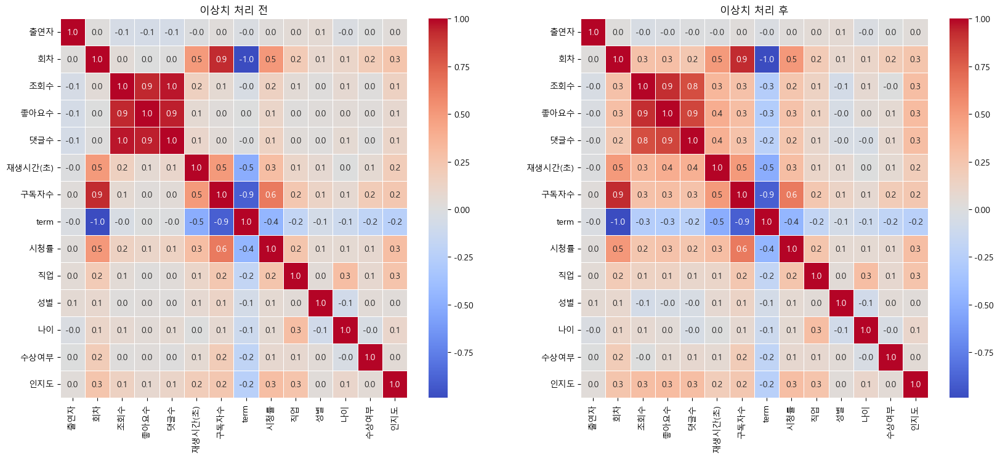

In [195]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 데이터프레임에서 상관 행렬 생성
correlation_matrix_2 = cl_labelEn_df.corr()
correlation_matrix_1 = labelEn_df.corr()

# 시각화
plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
plt.title('이상치 처리 전')
sns.heatmap(correlation_matrix_1, annot=True, cmap="coolwarm", fmt=".1f", linewidths=.5, annot_kws={"size": 10})

plt.subplot(1, 2, 2)
plt.title('이상치 처리 후')
sns.heatmap(correlation_matrix_2, annot=True, cmap="coolwarm", fmt=".1f", linewidths=.5, annot_kws={"size": 10})
plt.show()


c:\Users\PC\miniconda3\envs\ds_study\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


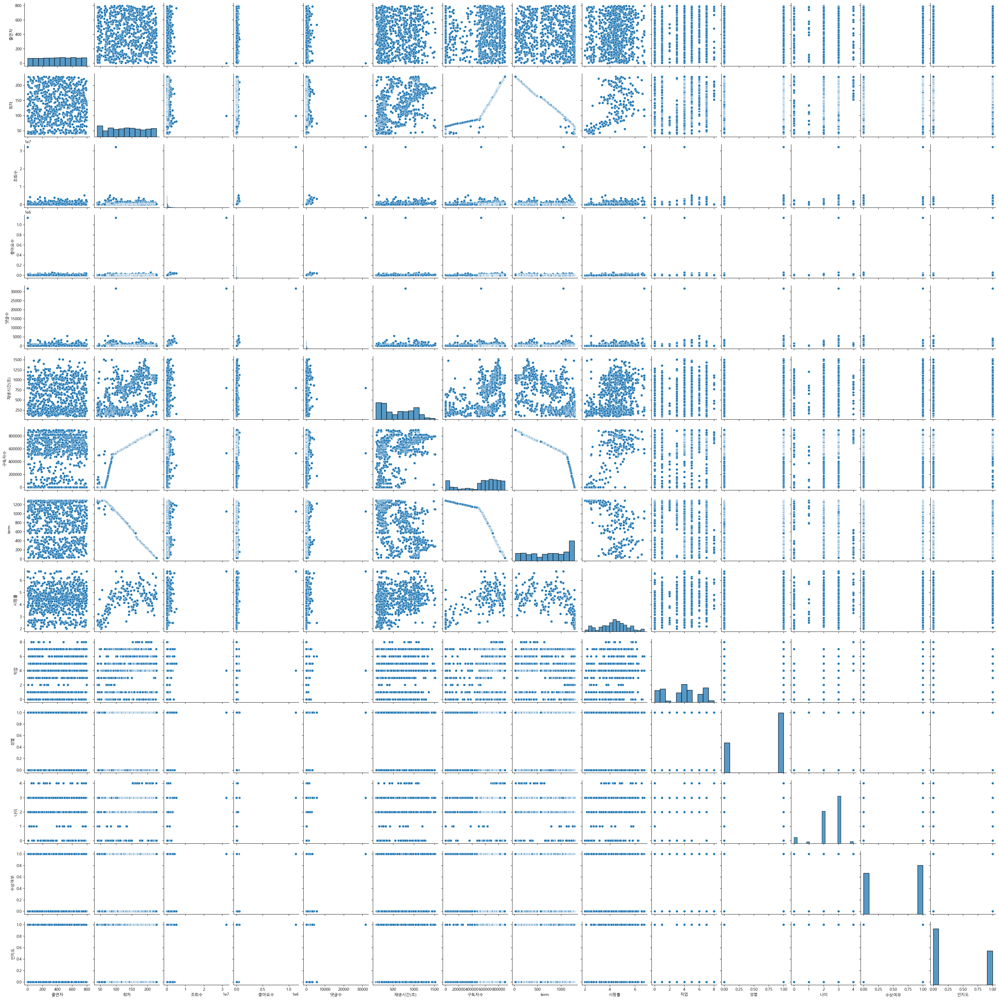

In [198]:
import seaborn as sns
import matplotlib.pyplot as plt

# 결측치 처리 전 데이터 프레임인 labelEn_df를 사용
sns.pairplot(labelEn_df)
plt.show()


잘은 모르겠지만, 치우쳐져 보임이 줄어듬

c:\Users\PC\miniconda3\envs\ds_study\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


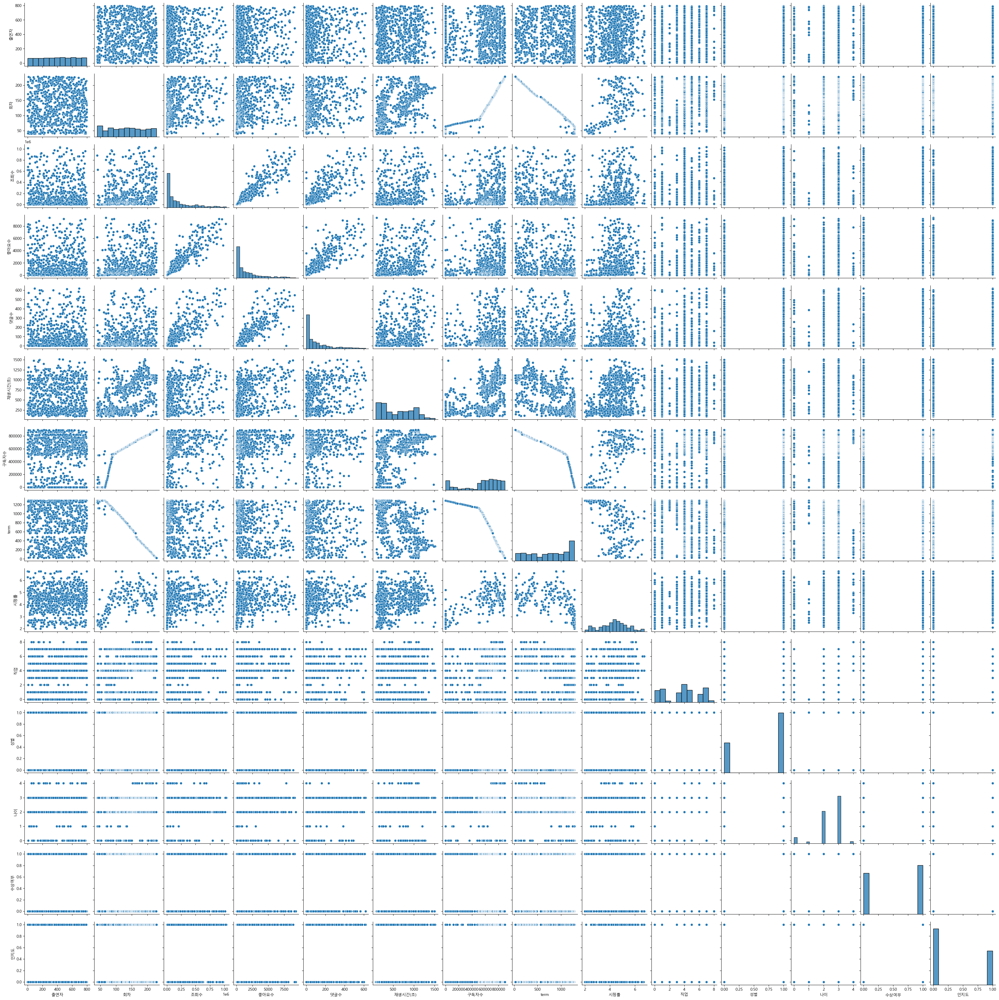

In [199]:
import seaborn as sns
import matplotlib.pyplot as plt

# 결측치 처리 후 데이터 프레임인 cl_labelEn_df를 사용
sns.pairplot(cl_labelEn_df)
plt.show()


## 2.데이터 탐색

c:\Users\PC\miniconda3\envs\ds_study\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


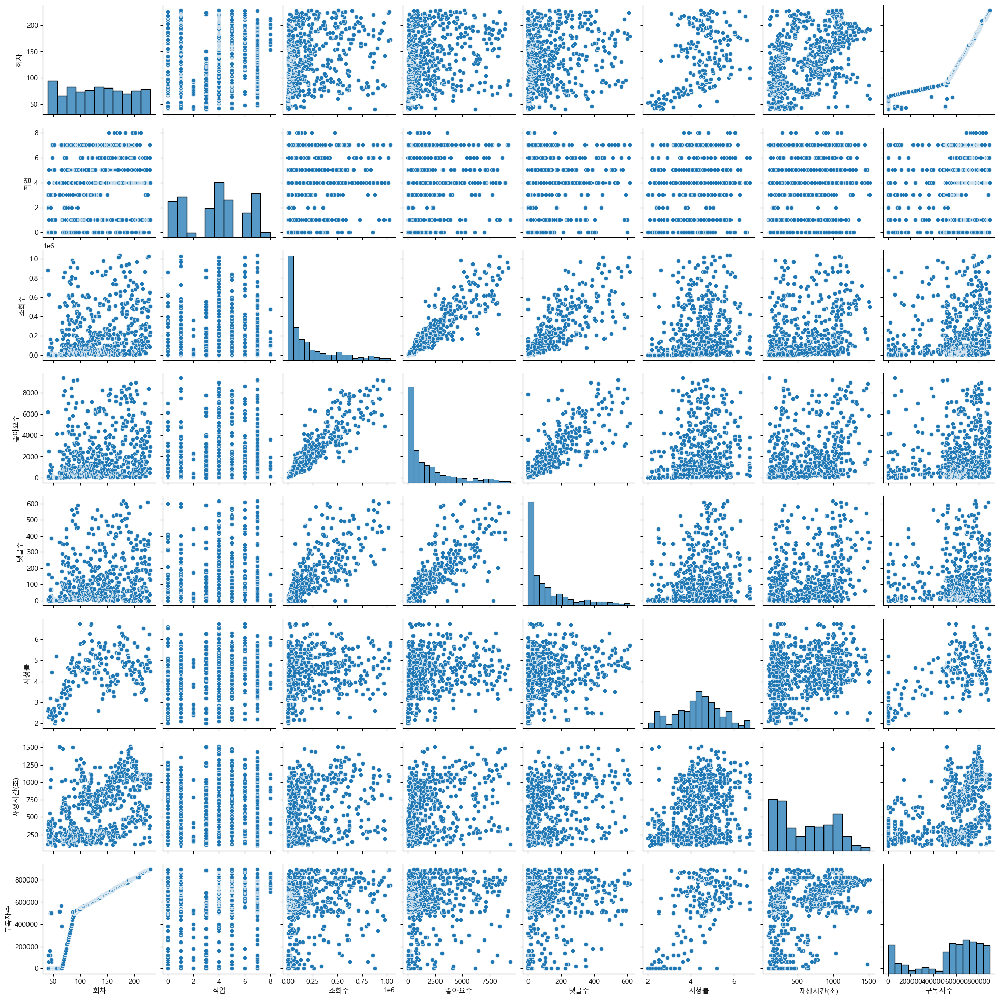

In [201]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(cl_labelEn_df[['회차','직업', '조회수', '좋아요수', '댓글수', '시청률', '재생시간(초)', '구독자수']])
plt.show()


Count Plot:

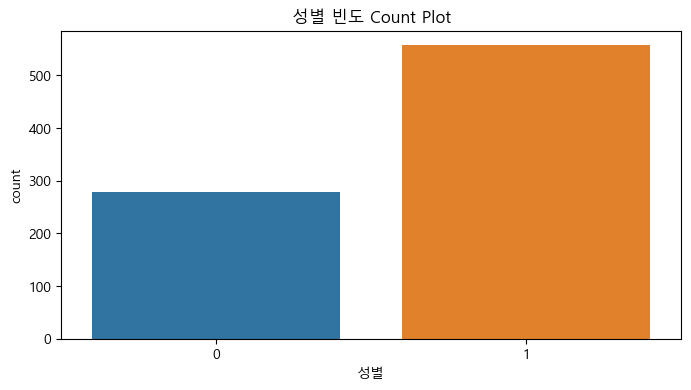

In [203]:
plt.figure(figsize=(8, 4))
sns.countplot(x='성별', data=cl_labelEn_df)
plt.title('성별 빈도 Count Plot')
plt.show()


Scatter Plot:
- 두 변수 간의 관계를 시각화할 수 있습니다.

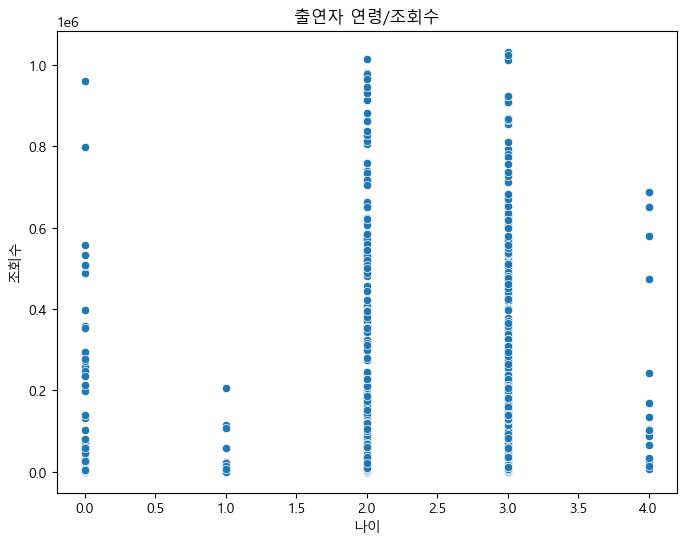

In [209]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='나이', y='조회수', data=cl_labelEn_df)
plt.title('출연자 연령/조회수')
plt.show()


회차별

Text(0.5, 1.0, '회차별 시청률')

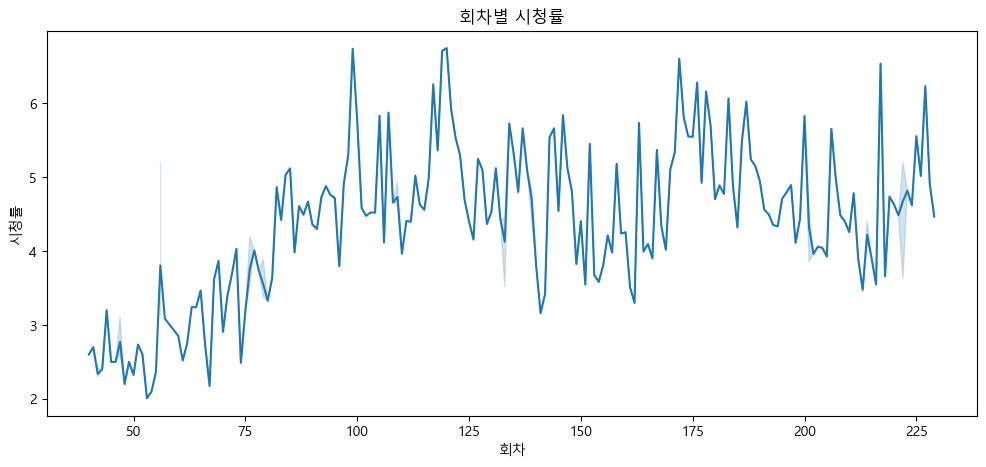

In [214]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 5))
sns.lineplot(x='회차', y='시청률', data=cl_labelEn_df)
plt.title('회차별 시청률')

Text(0.5, 1.0, '회차별 구독자수 증감')

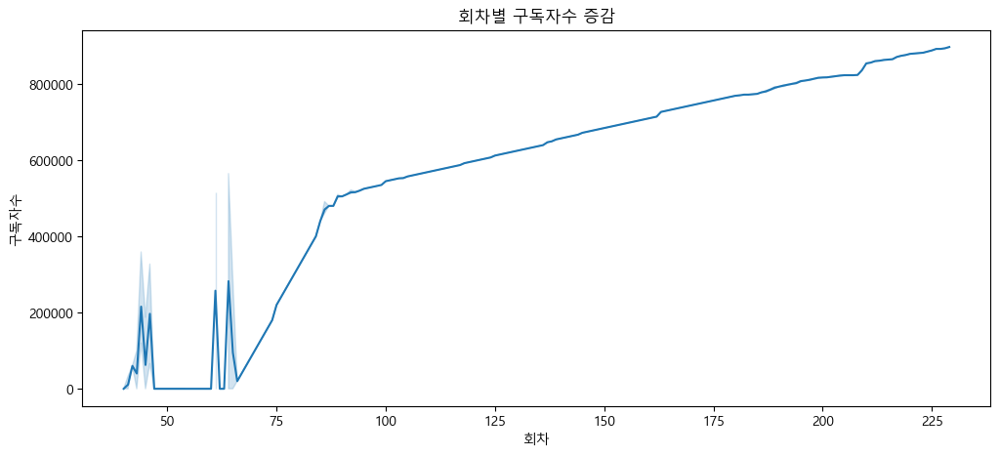

In [252]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 5))
sns.lineplot(x='회차', y='구독자수', data=cl_labelEn_df)
plt.title('회차별 구독자수 증감')

직업별

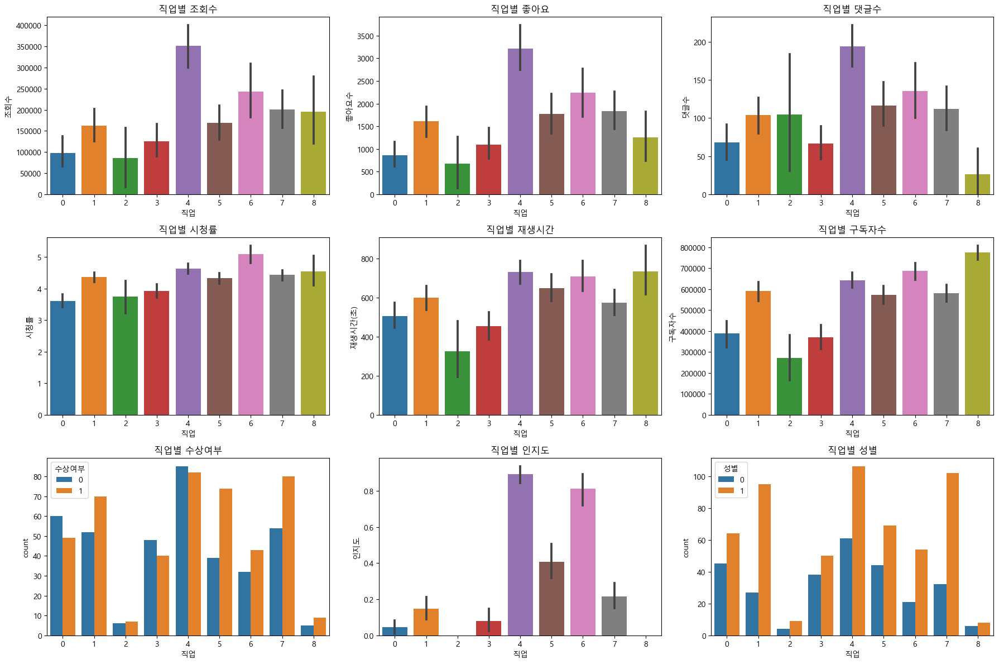

In [226]:
import matplotlib.pyplot as plt
import seaborn as sns

# 그래프의 전체 크기 설정
plt.figure(figsize=(18, 12))

# 조회수 - Barplot
plt.subplot(3, 3, 1)
sns.barplot(x='직업', y='조회수', data=cl_labelEn_df)
plt.title('직업별 조회수')

# 좋아요 - Barplot
plt.subplot(3, 3, 2)
sns.barplot(x='직업', y='좋아요수', data=cl_labelEn_df)
plt.title('직업별 좋아요')

# 댓글수 - Barplot
plt.subplot(3, 3, 3)
sns.barplot(x='직업', y='댓글수', data=cl_labelEn_df)
plt.title('직업별 댓글수')

# 시청률 - Barplot
plt.subplot(3, 3, 4)
sns.barplot(x='직업', y='시청률', data=cl_labelEn_df)
plt.title('직업별 시청률')

# 재생시간 - Lineplot
plt.subplot(3, 3, 5)
sns.barplot(x='직업', y='재생시간(초)', data=cl_labelEn_df)
plt.title('직업별 재생시간')

# 구독자수 - Lineplot
plt.subplot(3, 3, 6)
sns.barplot(x='직업', y='구독자수', data=cl_labelEn_df)
plt.title('직업별 구독자수')

# 수상여부 - Countplot
plt.subplot(3, 3, 7)
sns.countplot(x='직업', hue='수상여부', data=cl_labelEn_df)
plt.title('직업별 수상여부')

# 인지도 - Barplot
plt.subplot(3, 3, 8)
sns.barplot(x='직업', y='인지도', data=cl_labelEn_df)
plt.title('직업별 인지도')

# 성별 - Barplot
plt.subplot(3, 3, 9)
sns.countplot(x='직업', hue='성별', data=cl_labelEn_df)
plt.title('직업별 성별')

# 그래프들 간의 간격 조절
plt.tight_layout()

# 그래프 표시
plt.show()


<Figure size 1200x600 with 0 Axes>

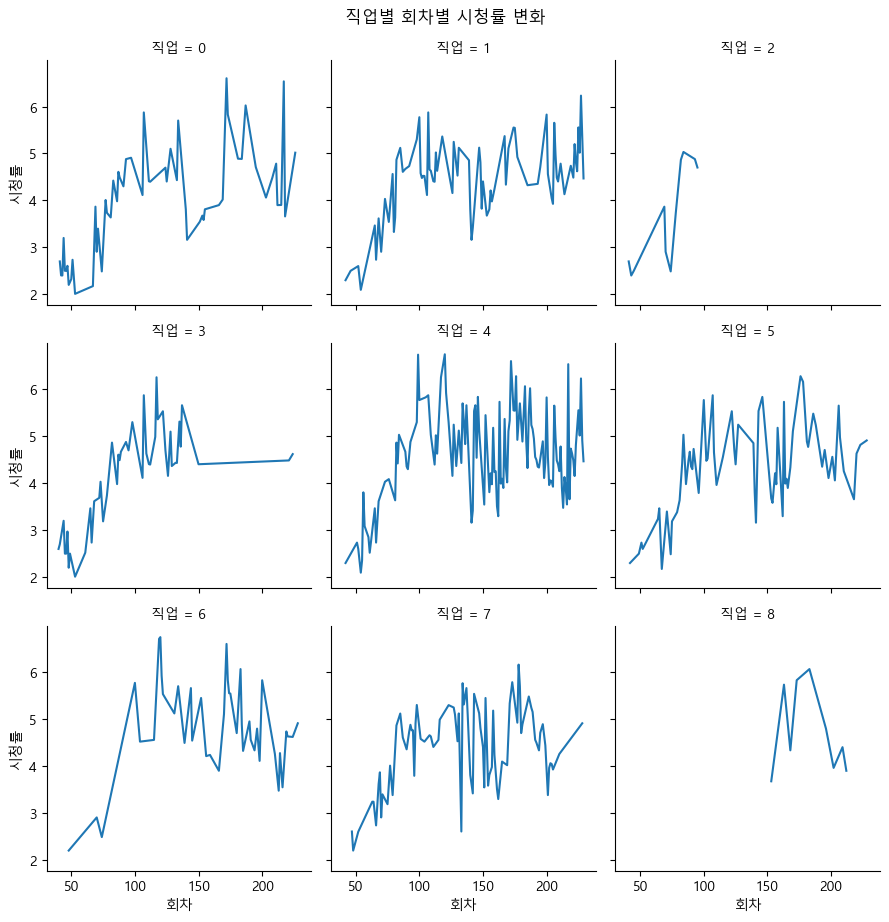

In [249]:
import warnings

# 경고 무시 설정
warnings.filterwarnings("ignore")

# 그래프의 전체 크기 설정
plt.figure(figsize=(12, 6))


# FacetGrid 생성
g = sns.FacetGrid(cl_labelEn_df, col="직업", col_wrap=3, height=3, margin_titles=True)
g.map(sns.lineplot, "회차", "시청률", ci=None) #"회차"를 x축, "시청률"을 y축으로 설정

# 그래프 표시
g.fig.suptitle('직업별 회차별 시청률 변화', y=1.02)
plt.show()


<Figure size 1200x600 with 0 Axes>

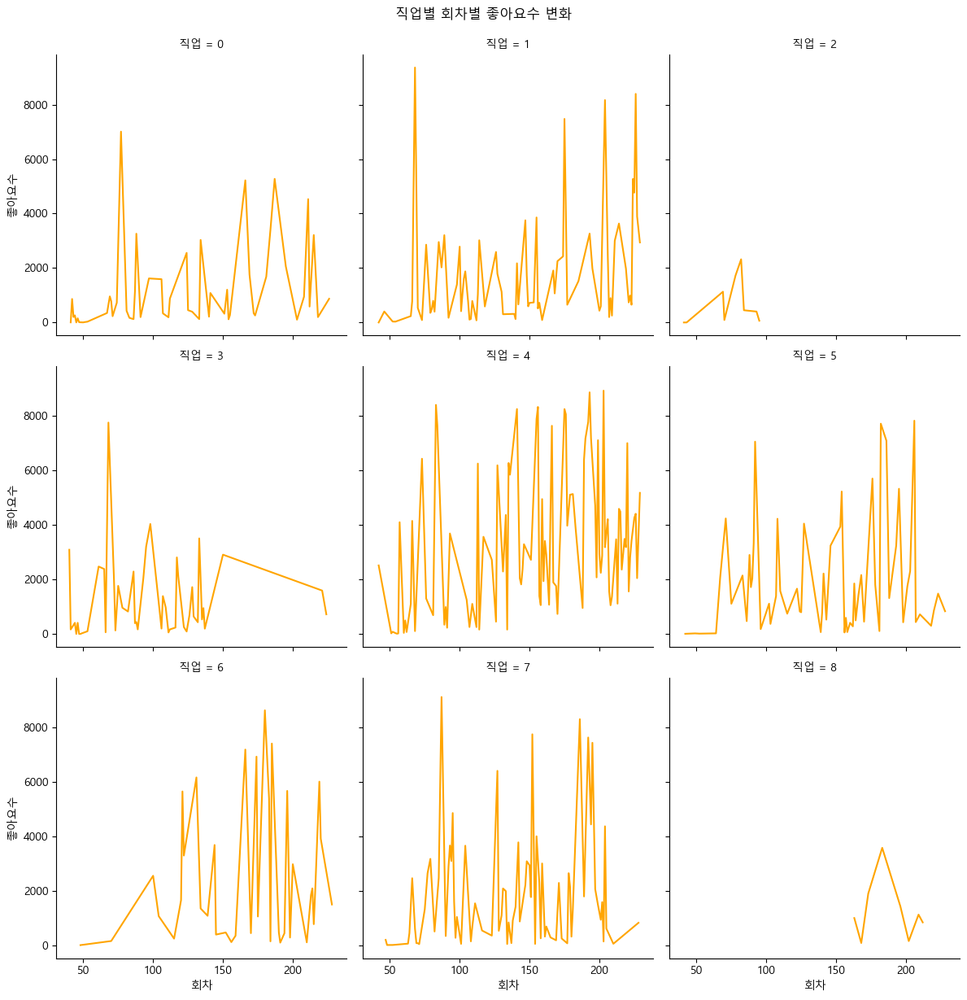

In [242]:
import warnings

# 경고 무시 설정
warnings.filterwarnings("ignore")

# 그래프의 전체 크기 설정
plt.figure(figsize=(12, 6))

# FacetGrid 생성
g = sns.FacetGrid(cl_labelEn_df, col="직업", col_wrap=3, height=4, margin_titles=True)
g.map(sns.lineplot, "회차", "좋아요수", ci=None, color='orange')

# 그래프 표시
g.fig.suptitle('직업별 회차별 좋아요수 변화', y=1.02)
plt.show()


<Figure size 1200x600 with 0 Axes>

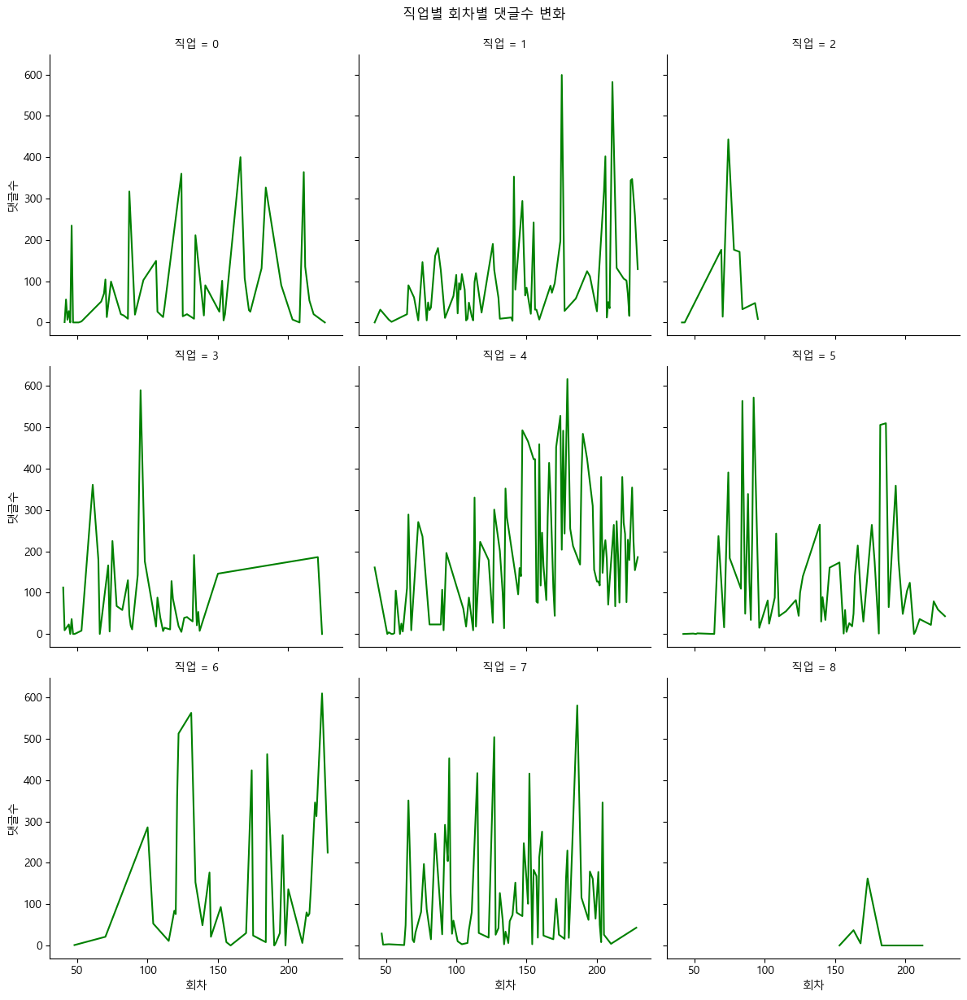

In [245]:
import warnings

# 경고 무시 설정
warnings.filterwarnings("ignore")

# 그래프의 전체 크기 설정
plt.figure(figsize=(12, 6))

# FacetGrid 생성
g = sns.FacetGrid(cl_labelEn_df, col="직업", col_wrap=3, height=4, margin_titles=True)
g.map(sns.lineplot, "회차", "댓글수", ci=None, color='green')

# 그래프 표시
g.fig.suptitle('직업별 회차별 댓글수 변화', y=1.02)
plt.show()


<Figure size 1200x600 with 0 Axes>

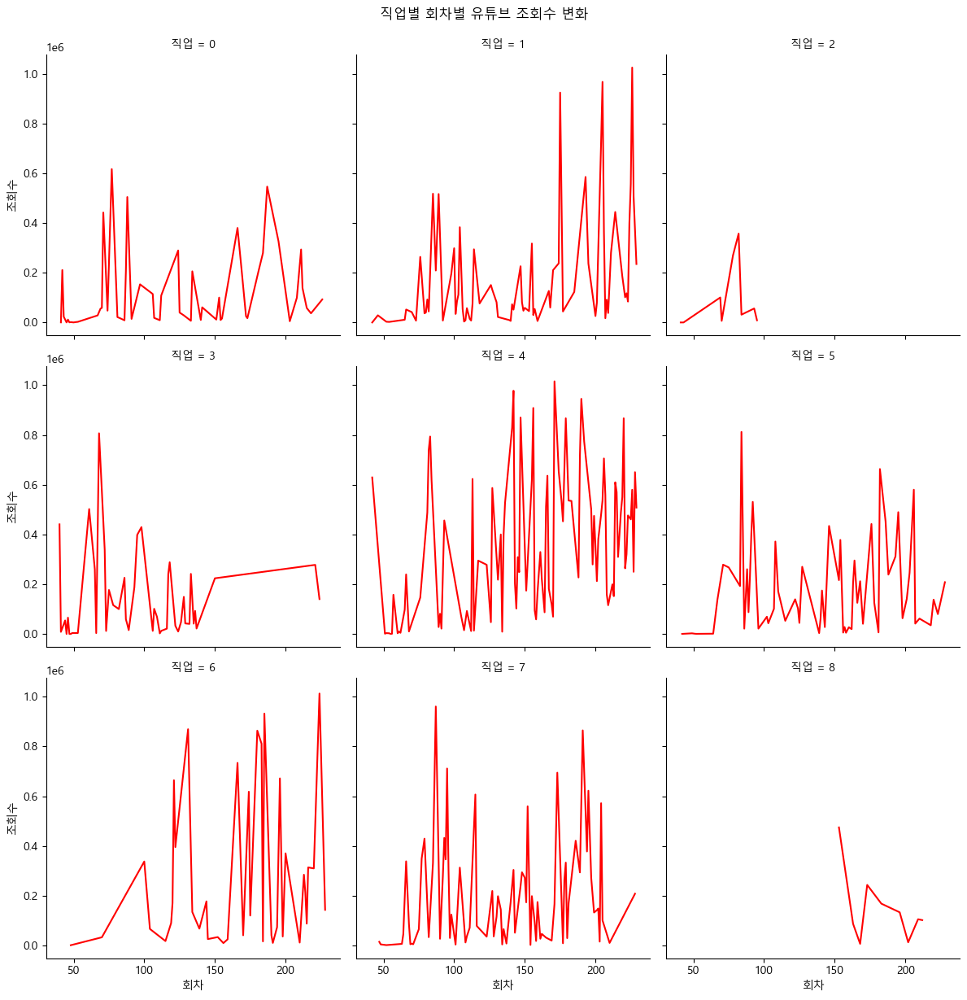

In [244]:
import warnings

# 경고 무시 설정
warnings.filterwarnings("ignore")

# 그래프의 전체 크기 설정
plt.figure(figsize=(12, 6))

# FacetGrid 생성
g = sns.FacetGrid(cl_labelEn_df, col="직업", col_wrap=3, height=4, margin_titles=True)
g.map(sns.lineplot, "회차", "조회수", ci=None, color='red')

# 그래프 표시
g.fig.suptitle('직업별 회차별 유튜브 조회수 변화', y=1.02)
plt.show()


<Figure size 1200x600 with 0 Axes>

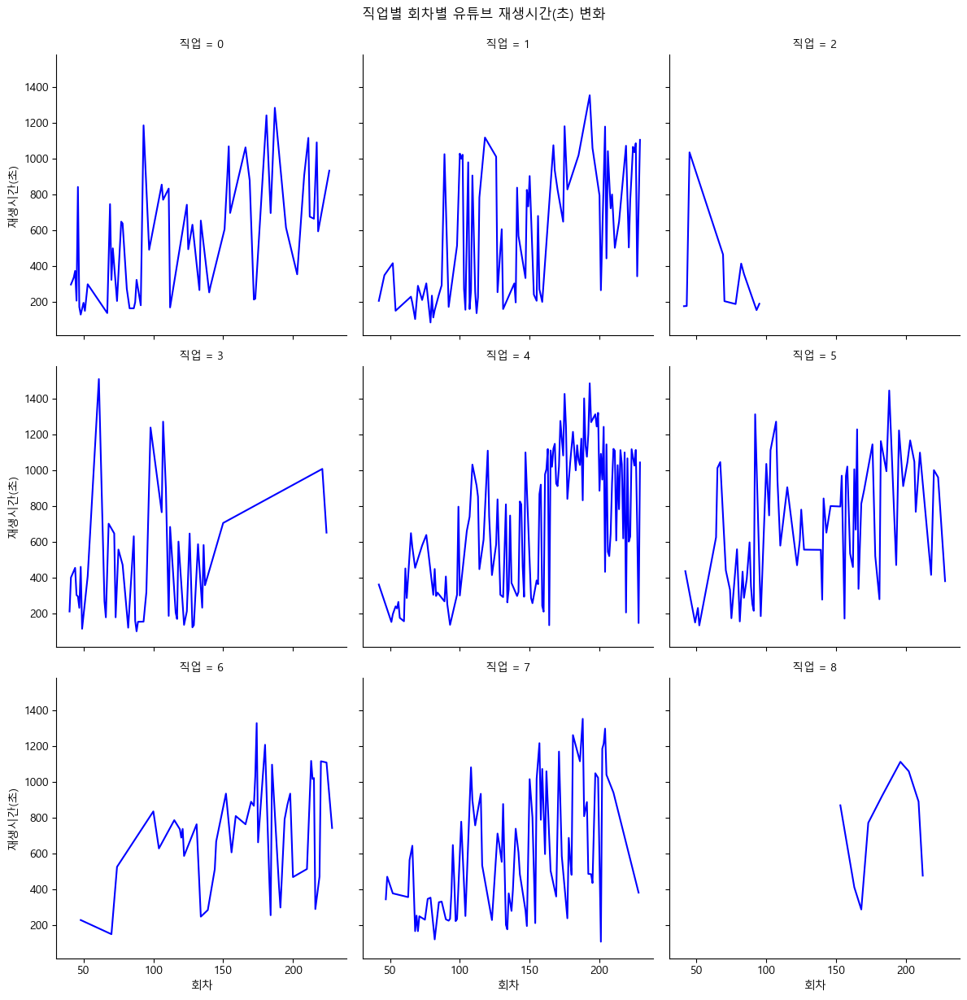

In [246]:
import warnings

# 경고 무시 설정
warnings.filterwarnings("ignore")

# 그래프의 전체 크기 설정
plt.figure(figsize=(12, 6))

# FacetGrid 생성
g = sns.FacetGrid(cl_labelEn_df, col="직업", col_wrap=3, height=4, margin_titles=True)
g.map(sns.lineplot, "회차", "재생시간(초)", ci=None, color='blue')

# 그래프 표시
g.fig.suptitle('직업별 회차별 유튜브 재생시간(초) 변화', y=1.02)
plt.show()


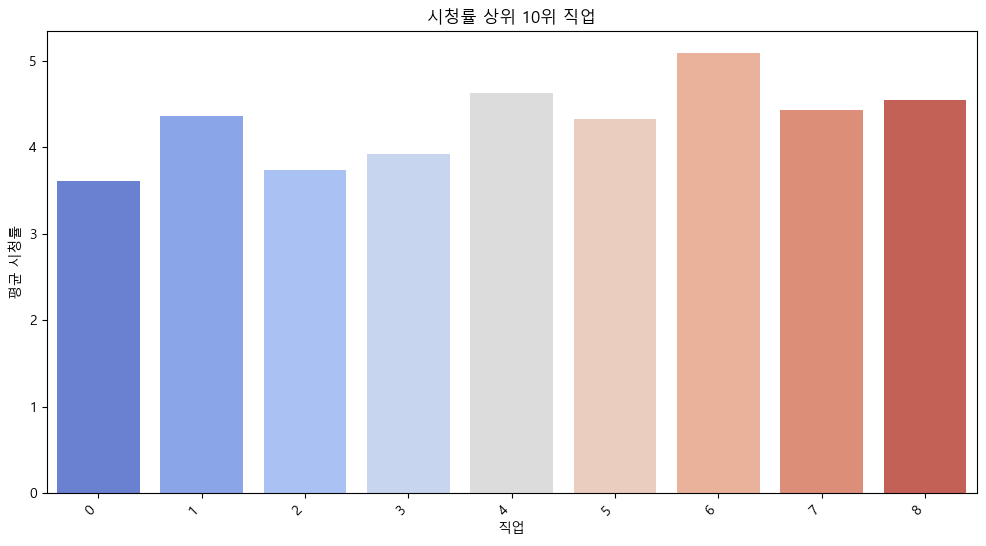

In [248]:
# 시청률 상위 10위의 직업을 찾기
top_10_occupations_by_rating = cl_labelEn_df.groupby('직업')['시청률'].mean().nlargest(10)

# 그래프 그리기
plt.figure(figsize=(12, 6))
sns.barplot(x=top_10_occupations_by_rating.index, y=top_10_occupations_by_rating.values, palette='coolwarm')
plt.title('시청률 상위 10위 직업')
plt.xlabel('직업')
plt.ylabel('평균 시청률')
plt.xticks(rotation=45, ha='right')
plt.show()


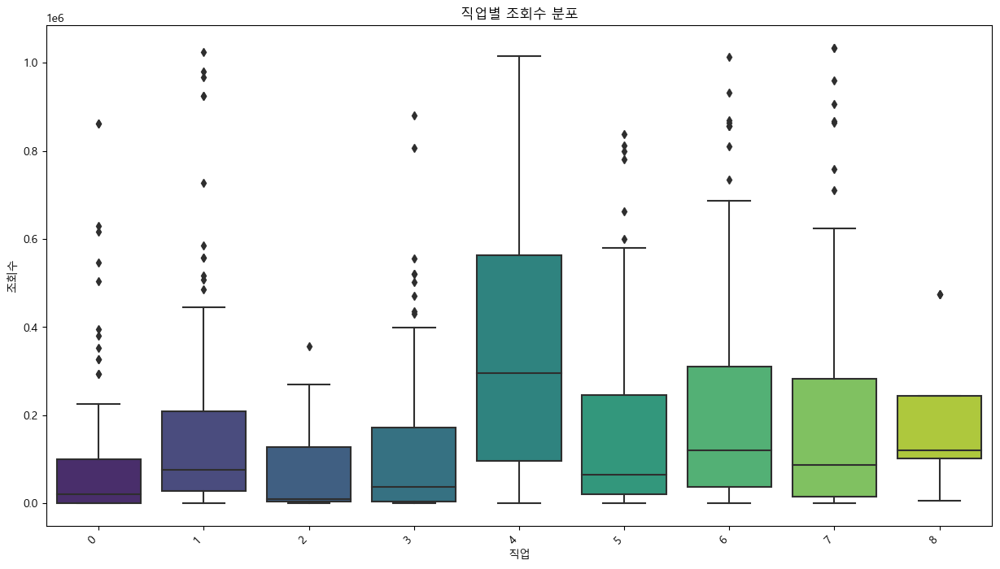

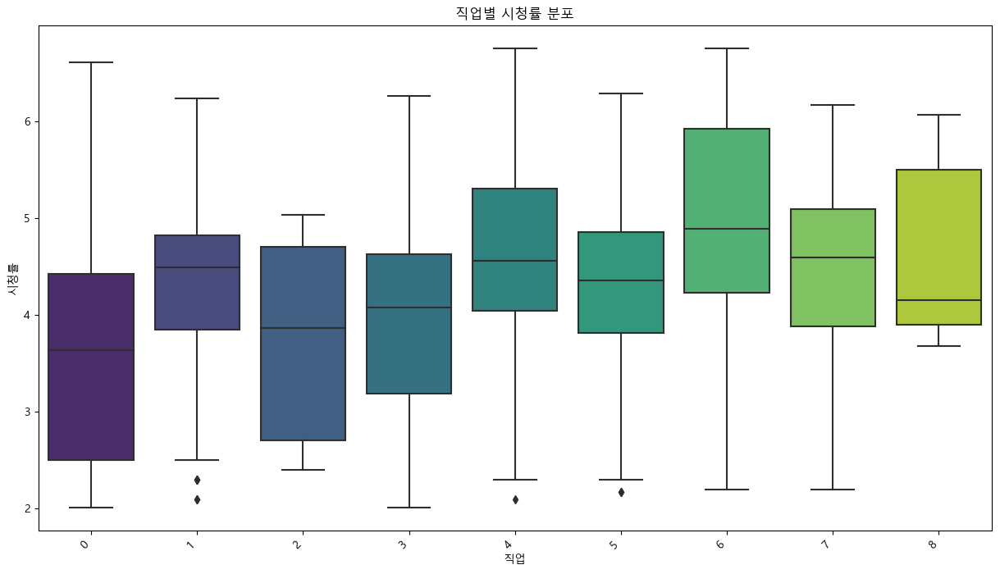

In [251]:
# 직업별 조회수와 시청률의 상자 그림
plt.figure(figsize=(15, 8))
sns.boxplot(x='직업', y='조회수', data=cl_labelEn_df, palette='viridis')
plt.title('직업별 조회수 분포')
plt.xticks(rotation=45, ha='right')
plt.show()

plt.figure(figsize=(15, 8))
sns.boxplot(x='직업', y='시청률', data=cl_labelEn_df, palette='viridis')
plt.title('직업별 시청률 분포')
plt.xticks(rotation=45, ha='right')
plt.show()


### 상관관계 분석

In [253]:
corr_matrix = cl_labelEn_df.corr()
corr_matrix['시청률'].sort_values(ascending=False)

시청률        1.000000
구독자수       0.645201
회차         0.508568
재생시간(초)    0.300550
인지도        0.299638
좋아요수       0.266803
직업         0.246597
조회수        0.243249
댓글수        0.241134
수상여부       0.081240
나이         0.067235
성별         0.063221
출연자        0.024316
term      -0.449966
Name: 시청률, dtype: float64

## 3.Train

In [254]:
import pandas as pd
import numpy as np

from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder

from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.model_selection import KFold

data set

In [261]:
raw_df = pd.read_csv('./Fin.csv')
raw_df = raw_df.drop(['Unnamed: 0', '제목'], axis=1)

raw_df['구독자수'] = raw_df['구독자수'].str.replace(",", "")
raw_df['구독자수'] = pd.to_numeric(raw_df['구독자수'], errors='coerce') # # '구독자수' 컬럼의 데이터를 숫자로 변환

labelEn_df = raw_df.copy()

#-------------------------------------------------------------------------------------

job = labelEn_df['직업'].unique()
sex = labelEn_df['성별'].unique()
age = labelEn_df['나이'].unique()
awr = labelEn_df['수상여부'].unique()
pop = labelEn_df['인지도'].unique()
host = labelEn_df['출연자'].unique()

#-------------------------------------------------------------------------------------

job_encoder = LabelEncoder()
labelEn_df['직업'] = job_encoder.fit_transform(labelEn_df['직업'])
sex_encoder = LabelEncoder()
labelEn_df['성별'] = sex_encoder.fit_transform(labelEn_df['성별'])
age_encoder = LabelEncoder()
labelEn_df['나이'] = age_encoder.fit_transform(labelEn_df['나이'])
awr_encoder = LabelEncoder()
labelEn_df['수상여부'] = awr_encoder.fit_transform(labelEn_df['수상여부'])
pop_encoder = LabelEncoder()
labelEn_df['인지도'] = pop_encoder.fit_transform(labelEn_df['인지도'])
host_encoder = LabelEncoder()
labelEn_df['출연자'] = host_encoder.fit_transform(labelEn_df['출연자'])

print(f"직업(Label Encoding): {dict(zip(job, job_encoder.transform(job)))}")
print(f"성별(Label Encoding): {dict(zip(sex, sex_encoder.transform(sex)))}")
print(f"나이(Label Encoding): {dict(zip(age, age_encoder.transform(age)))}")
print(f"수상여부(Label Encoding): {dict(zip(awr, awr_encoder.transform(awr)))}")
print(f"인지도(Label Encoding): {dict(zip(pop, pop_encoder.transform(pop)))}")
print(f"출연자(Label Encoding): {dict(zip(host, host_encoder.transform(host)))}")

#-------------------------------------------------------------------------------------

def remove_outliers_tukey(data, k=1.5):
    Q1 = np.percentile(data, 25, axis=0)
    Q3 = np.percentile(data, 75, axis=0)
    IQR = Q3 - Q1
    lower_bound = Q1 - k * IQR
    upper_bound = Q3 + k * IQR
    without_outliers = data[(data >= lower_bound) & (data <= upper_bound)].dropna()

    return without_outliers

columns_to_check = ['조회수', '좋아요수', '댓글수']
cl_labelEn_df = labelEn_df.copy()

for column in columns_to_check:
    cl_labelEn_df[column] = remove_outliers_tukey(cl_labelEn_df[column])

cl_labelEn_df.info()

직업(Label Encoding): {'서비스': 3, '기타': 0, '산업': 2, '전문기술': 7, '운동선수': 6, '예술인': 5, '연예인': 4, '사회복지': 1, '학생': 8}
성별(Label Encoding): {'M': 1, 'F': 0}
나이(Label Encoding): {'중년': 2, '청년': 3, '노년': 0, '어린이': 1, '청소년': 4}
수상여부(Label Encoding): {'Y': 1, 'N': 0}
인지도(Label Encoding): {'Y': 1, 'N': 0}
출연자(Label Encoding): {'나영석': 221, '이명진': 513, '김부연': 103, '김유자': 160, '김만순': 88, '전정자': 641, '강충구': 20, '김정순': 174, '한정석': 767, '홍보민': 782, '길태후': 58, '길흥순': 59, '서담희': 335, '세나': 353, '남숙현': 226, '김기숙': 69, '임재윤': 611, '이규형': 493, '김범준': 101, '최연애': 730, '고대영': 25, '고석교': 27, '김현지': 210, '김현이': 209, '이태석': 590, '정대례': 648, '김슬기': 127, '서명옥': 338, '함범녀': 771, '배용호': 313, '이동훈': 510, '이지연': 582, '강미연': 9, '차금덕': 718, '신덕순': 378, '김한슬': 205, '김건태': 63, '최자영': 736, '최희화': 743, '김지헌': 183, '최정희': 738, '신원호': 386, '김대주': 78, '김란주': 86, '정종연': 668, '이명한': 515, '이윤수': 555, '이준서': 577, '김민주': 98, '박영서': 287, '박서현': 279, '오동고 프란시스 응고메 오켈로': 431, '재재': 636, '장명숙': 625, '박지선': 298, '유성호': 459, '표창원': 756, '진용

----

### GradientBoostingRegressor

'Input y contains NaN'
- NaN이 없었음에도 발생했다는 에러가 출력되어 평균값, 중앙값, 또는 특정 값으로 대체함

In [263]:
cl_labelEn_df = cl_labelEn_df.fillna(cl_labelEn_df.mean())

Gradient Boosting 모델의 경우 다중 출력(multi-output)이 지원되지 않음
- 코드 분리해서 써줘야 함
- y를 1차원 배열로 변환

- 모든 출력 변수에 대한 성능을 개별적으로 확인하고 싶었음

In [306]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

# X와 y 나누기
X = cl_labelEn_df[['회차', '직업', '성별', '나이']]  # 인적사항을 넣음
y = cl_labelEn_df[['조회수', '좋아요수', '댓글수', '시청률', '재생시간(초)', '구독자수', '수상여부', '인지도']]  # 예측하고자 하는 값

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)  # 8:2로 학습

# Gradient Boosting 모델 정의
gb_model = GradientBoostingRegressor()

# 각 출력 변수에 대해 모델 훈련 및 평가
for i, output_var in enumerate(y.columns):
    
    # 모델 훈련
    gb_model.fit(X_train, y_train[output_var])
    
    # 테스트 세트로 예측
    y_pred = gb_model.predict(X_test)
    
    # 모델 평가
    mse = mean_squared_error(y_test[output_var], y_pred)
    r2 = r2_score(y_test[output_var], y_pred)
    print(f'MSE {output_var}: {mse}')
    print(f'r2 {output_var}: {r2}\n')


MSE 조회수: 47884583794.93789
r2 조회수: 0.12591743892196572

MSE 좋아요수: 3548796.223409734
r2 좋아요수: 0.22006684306414415

MSE 댓글수: 12967.861870449371
r2 댓글수: 0.17654252978177865

MSE 시청률: 0.18533141630927333
r2 시청률: 0.8335871085620313

MSE 재생시간(초): 94922.01633075655
r2 재생시간(초): 0.3679874306587453

MSE 구독자수: 2341469491.3186116
r2 구독자수: 0.9720372381284819

MSE 수상여부: 0.23507986342112946
r2 수상여부: 0.04457267400876108

MSE 인지도: 0.09851699622411239
r2 인지도: 0.5832007724978352



### LinearRegression/RandomForestRegressor/DecisionTreeRegressor

In [313]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score

# X와 y 나누기
X = cl_labelEn_df[['회차', '직업', '성별', '나이']]  # 인적사항을 넣음
y = cl_labelEn_df[['조회수', '좋아요수', '댓글수', '시청률', '재생시간(초)', '구독자수', '수상여부', '인지도']]  # 예측하고자 하는 값

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=13)  # 8:2로 학습

# 다양한 회귀 모델 정의
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(),
    'Decision Tree': DecisionTreeRegressor()
}

# 결과를 파일에 저장
with open('model_results.txt', 'w') as file:
    # 모델 훈련 및 평가
    for name, model in models.items():
        
        # 모델 훈련
        model.fit(X_train, y_train)
        
        # 테스트 세트로 예측
        y_pred = model.predict(X_test)
        
        # 모델 평가
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        file.write(f'MSE {name}: {mse}\n')
        file.write(f'r2 {name}: {r2}\n')
        
        # 각 출력 변수에 대한 R-squared 값 출력
        for i, output_var in enumerate(y.columns):
            r2_output_var = r2_score(y_test[output_var], y_pred[:, i])
            file.write(f'r2 {output_var} : {r2_output_var}\n')
        
        file.write('\n')

# # 모델 훈련 및 평가
# for name, model in models.items():
#     print(f"Training {name}...")
    
#     # 모델 훈련
#     model.fit(X_train, y_train)
    
#     # 테스트 세트로 예측
#     y_pred = model.predict(X_test)
    
#     # 모델 평가
#     mse = mean_squared_error(y_test, y_pred)
#     r2 = r2_score(y_test, y_pred)
#     print(f'Mean Squared Error for {name}: {mse}')
#     print(f'R-squared for {name}: {r2}')
    
#     # 각 출력 변수에 대한 R-squared 값 출력
#     for i, output_var in enumerate(y.columns):
#         r2_output_var = r2_score(y_test[output_var], y_pred[:, i])
#         print(f'R-squared for {output_var} ({name}): {r2_output_var}')
    
#     print('\n')


# 'model_results.txt' 파일에서 처음 20줄 읽어오기
with open('model_results.txt', 'r') as file:
    lines = file.readlines()

In [315]:
for line in lines[:11]:
    print(line)

MSE Linear Regression: 6850696523.202204

r2 Linear Regression: 0.21290059974522563

r2 조회수 : 0.07553132176789623

r2 좋아요수 : 0.0472664456246753

r2 댓글수 : 0.0853460527546479

r2 시청률 : 0.25342601482098615

r2 재생시간(초) : 0.2634075554231955

r2 구독자수 : 0.8597553323333116

r2 수상여부 : 0.012312197137897773

r2 인지도 : 0.1061598780991947





In [317]:
for line in lines[11:22]:
    print(line)

MSE Random Forest: 5976655605.320376

r2 Random Forest: 0.28162986476667795

r2 조회수 : 0.022914145731167568

r2 좋아요수 : -0.019496485984469736

r2 댓글수 : 0.03744248166195163

r2 시청률 : 0.8234186858242959

r2 재생시간(초) : 0.24111642085246499

r2 구독자수 : 0.9932866114990511

r2 수상여부 : -0.12242040771930585

r2 인지도 : 0.27677746626826794





In [318]:
for line in lines[22:]:
    print(line)

MSE Decision Tree: 9376935392.87116

r2 Decision Tree: -0.19095256002456462

r2 조회수 : -0.5426659856991078

r2 좋아요수 : -0.876130309563697

r2 댓글수 : -0.461473998118084

r2 시청률 : 0.6903869626790162

r2 재생시간(초) : -0.2150767870961845

r2 구독자수 : 0.9960478061514795

r2 수상여부 : -0.7459224363892081

r2 인지도 : -0.3727857321607324





GradientBoostingRegressor
- 시청률, 구독자수, 재생시간(초), 인지도 등의 변수에 대해 R-squared 값이 상대적으로 높게 나타남
- Decision Tree 모델은 대부분의 변수에 대해 성능이 낮게 나타남, 과적합으로 예상됨
- RandomForestRegressor는 Decision Tree보다는 성능이 좋지만, GradientBoostingRegressor보다는 낮은 성능

### MinMaxScaler와 KFold
- 과적합이 있었으니, MinMaxScaler와 KFold를 사용해보고자 함

In [334]:
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# 데이터를 MinMaxScaler로 스케일링
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# KFold를 사용하여 데이터 분할
kf = KFold(n_splits=5, shuffle=True, random_state=13)

# 모델 정의
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(),
    'Decision Tree': DecisionTreeRegressor()
}

# 결과를 파일에 저장
with open('model_results_with_scaling_and_kfold.txt', 'w') as file:
    # 모델 훈련 및 평가
    for name, model in models.items():
        mse_list = []
        r2_list = []
        
        for train_idx, test_idx in kf.split(X_scaled):
            X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
            y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
            
            # 모델 훈련
            model.fit(X_train, y_train)
            
            # 테스트 세트로 예측
            y_pred = model.predict(X_test)
            
            # 모델 평가
            mse = mean_squared_error(y_test, y_pred)
            r2 = r2_score(y_test, y_pred)
            
            mse_list.append(mse)
            r2_list.append(r2)
        
        # 평균 MSE, 평균 R-squared 계산
        avg_mse = np.mean(mse_list)
        avg_r2 = np.mean(r2_list)
        
        # 결과 파일에 기록
        file.write(f'Mean MSE {name}: {avg_mse}\n')
        file.write(f'Mean R-squared {name}: {avg_r2}\n\n')


In [336]:
for line in lines[:]:
    print(line)

MSE Linear Regression: 6850696523.202204

r2 Linear Regression: 0.21290059974522563

r2 조회수 : 0.07553132176789623

r2 좋아요수 : 0.0472664456246753

r2 댓글수 : 0.0853460527546479

r2 시청률 : 0.25342601482098615

r2 재생시간(초) : 0.2634075554231955

r2 구독자수 : 0.8597553323333116

r2 수상여부 : 0.012312197137897773

r2 인지도 : 0.1061598780991947



MSE Random Forest: 5976655605.320376

r2 Random Forest: 0.28162986476667795

r2 조회수 : 0.022914145731167568

r2 좋아요수 : -0.019496485984469736

r2 댓글수 : 0.03744248166195163

r2 시청률 : 0.8234186858242959

r2 재생시간(초) : 0.24111642085246499

r2 구독자수 : 0.9932866114990511

r2 수상여부 : -0.12242040771930585

r2 인지도 : 0.27677746626826794



MSE Decision Tree: 9376935392.87116

r2 Decision Tree: -0.19095256002456462

r2 조회수 : -0.5426659856991078

r2 좋아요수 : -0.876130309563697

r2 댓글수 : -0.461473998118084

r2 시청률 : 0.6903869626790162

r2 재생시간(초) : -0.2150767870961845

r2 구독자수 : 0.9960478061514795

r2 수상여부 : -0.7459224363892081

r2 인지도 : -0.3727857321607324





- 사용 전후 결과가 거의 동일함
- 케일링 및 교차 검증 적용 전후에 큰 차이가 나타나지 않음
- 파라미터 튜닝을 해야하는지 고민 됨..

----

### VotingRegressor 
- LinearRegression/DecisionTreeRegressor/RandomForestRegressor
- VotingRegressor는 주로 서로 다른 유형의 회귀 모델을 결합하여 각 모델의 강점을 활용하는 데 사용

In [325]:
from sklearn.ensemble import VotingRegressor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score

# X와 y 나누기
X = cl_labelEn_df[['회차', '직업', '성별', '나이']]  # 인적사항을 넣음
y = cl_labelEn_df[['조회수', '좋아요수', '댓글수', '시청률', '재생시간(초)', '구독자수', '수상여부', '인지도']]  # 예측하고자 하는 값

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=13)  # 8:2로 학습

# 다양한 회귀 모델 정의
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(),
    'Decision Tree': DecisionTreeRegressor()
}

# Voting Regressor 정의 (다중 출력 회귀 문제 처리)
voting_reg = VotingRegressor(estimators=[(name, model) for name, model in models.items()], n_jobs=-1)

# 각 출력 변수에 대해 Voting Regressor 모델 훈련 및 평가
for i, output_var in enumerate(y.columns):
    
    # 모델 훈련
    voting_reg.fit(X_train, y_train[output_var])
    
    # 테스트 세트로 예측
    y_pred_voting = voting_reg.predict(X_test)
    
    # 모델 평가
    mse_voting = mean_squared_error(y_test[output_var], y_pred_voting)
    r2_voting = r2_score(y_test[output_var], y_pred_voting)
    
    # 출력 변수에 대한 결과 출력
    print(f'MSE {output_var} (Voting): {mse_voting}')
    print(f'r2 {output_var} (Voting): {r2_voting}\n')


MSE 조회수 (Voting): 44097877699.32259
r2 조회수 (Voting): 0.0896451783197828

MSE 좋아요수 (Voting): 2938435.8317484655
r2 좋아요수 (Voting): 0.02414675555429635

MSE 댓글수 (Voting): 16757.382113836964
r2 댓글수 (Voting): 0.09247114520130462

MSE 시청률 (Voting): 0.15470081590055865
r2 시청률 (Voting): 0.8622144987859968

MSE 재생시간(초) (Voting): 117157.78608956301
r2 재생시간(초) (Voting): 0.18813726066836212

MSE 구독자수 (Voting): 2665081029.084455
r2 구독자수 (Voting): 0.9627020702632331

MSE 수상여부 (Voting): 0.26062534901828127
r2 수상여부 (Voting): -0.045538026290397715

MSE 인지도 (Voting): 0.1496261485737108
r2 인지도 (Voting): 0.32868023526830425



- Voting Regressor는 대부분의 출력 변수에 대해 Linear Regression 및 Random Forest와 비슷하거나 약간 낮은 성능을 보임
- Decision Tree의 경우 R-squared 값이 음수로 나타나며, 다른 모델과 비교했을 때 예측 성능이 낮은 편
- Voting Regressor를 통해 여러 모델을 결합했지만, 모든 경우에서 개별 모델들보다 성능이 크게 향상되지 않았음...

----

### XGBRegressor/LGBMRegressor
- LinearRegression/DecisionTreeRegressor/RandomForestRegressor

In [326]:
from sklearn.ensemble import VotingRegressor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, r2_score

# X와 y 나누기
X = cl_labelEn_df[['회차', '직업', '성별', '나이']]  # 인적사항을 넣음
y = cl_labelEn_df[['조회수', '좋아요수', '댓글수', '시청률', '재생시간(초)', '구독자수', '수상여부', '인지도']]  # 예측하고자 하는 값

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=13)  # 8:2로 학습

# 다양한 회귀 모델 정의
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(),
    'Decision Tree': DecisionTreeRegressor(),
    'XGBoost': XGBRegressor(),
    'LightGBM': LGBMRegressor()
}

# Voting Regressor 정의 (다중 출력 회귀 문제 처리)
voting_reg = VotingRegressor(estimators=[(name, model) for name, model in models.items()], n_jobs=-1)

# 각 출력 변수에 대해 Voting Regressor 모델 훈련 및 평가
for i, output_var in enumerate(y.columns):
    
    # 모델 훈련
    voting_reg.fit(X_train, y_train[output_var])
    
    # 테스트 세트로 예측
    y_pred_voting = voting_reg.predict(X_test)
    
    # 모델 평가
    mse_voting = mean_squared_error(y_test[output_var], y_pred_voting)
    r2_voting = r2_score(y_test[output_var], y_pred_voting)
    
    # 출력 변수에 대한 결과 출력
    print(f'MSE {output_var} (Voting): {mse_voting}')
    print(f'r2 {output_var} (Voting): {r2_voting}\n')


MSE 조회수 (Voting): 43525053907.629234
r2 조회수 (Voting): 0.10147052974138204

MSE 좋아요수 (Voting): 2874619.8962932853
r2 좋아요수 (Voting): 0.04533999958856194

MSE 댓글수 (Voting): 15883.729051155802
r2 댓글수 (Voting): 0.1397855382300175

MSE 시청률 (Voting): 0.10137944924508079
r2 시청률 (Voting): 0.9097055943388686

MSE 재생시간(초) (Voting): 110357.23606570993
r2 재생시간(초) (Voting): 0.23526270879783173

MSE 구독자수 (Voting): 1507183582.0287852
r2 구독자수 (Voting): 0.9789068974903814

MSE 수상여부 (Voting): 0.26556109636366376
r2 수상여부 (Voting): -0.06533852366027282

MSE 인지도 (Voting): 0.1499668796602208
r2 인지도 (Voting): 0.3271514950379829



- XGBRegressor/LGBMRegressor 했지만 크게 향상되지 않았음

----

### XGBRegressor/LGBMRegressor
- GradientBoostingRegressor 

- LGBMRegressor 은 단일 출력에 대해서만 지원해줌. 다중 출력을 위해 MultiOutputRegressor를 사용

In [333]:
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# X와 y 나누기
X = cl_labelEn_df[['회차', '직업', '성별', '나이']]  # 인적사항을 넣음
y = cl_labelEn_df[['조회수', '좋아요수', '댓글수', '시청률', '재생시간(초)', '구독자수', '수상여부', '인지도']]  # 예측하고자 하는 값

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=13)  # 8:2로 학습

# 각 모델 정의 및 훈련
xgb_model = MultiOutputRegressor(XGBRegressor())
lgbm_models = [LGBMRegressor() for _ in range(y.shape[1])]  # 각 대상에 대한 별도의 LGBMRegressor 생성
gb_model = MultiOutputRegressor(GradientBoostingRegressor())

# 각 모델 훈련 및 평가
xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)
print(f'MSE XGBoost: {mse_xgb}, R-squared XGBoost: {r2_xgb}\n')

for lgbm_model, target in zip(lgbm_models, y.columns):
    lgbm_model.fit(X_train, y_train[target])
    y_pred_lgbm = lgbm_model.predict(X_test)
    mse_lgbm = mean_squared_error(y_test[target], y_pred_lgbm)
    r2_lgbm = r2_score(y_test[target], y_pred_lgbm)
    print(f'MSE LightGBM ({target}): {mse_lgbm}, R-squared LightGBM ({target}): {r2_lgbm}')

gb_model.fit(X_train, y_train)
y_pred_gb = gb_model.predict(X_test)
mse_gb = mean_squared_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)
print(f'\nMSE GradientBoosting: {mse_gb}, R-squared GradientBoosting: {r2_gb}\n')


MSE XGBoost: 6964787786.439635, R-squared XGBoost: 0.15331056052540798

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000044 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 165
[LightGBM] [Info] Number of data points in the train set: 668, number of used features: 4
[LightGBM] [Info] Start training from score 199151.493263
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

XGBoost 결과:
- MSE XGBoost (조회수): 6964787786.439635
- R-squared XGBoost (조회수): 0.15331056052540798

</br>

GradientBoosting 결과:
- MSE GradientBoosting (조회수): 5715824679.872495
- R-squared GradientBoosting (조회수): 0.33282433581265813

GradientBoosting 의 성능이 더 좋음

-----

### KFold
- GradientBoosting에 적용

</br>

- 데이터셋이 작거나 모델이 과적합(overfitting)될 가능성이 있는 경우에 유용
- 아까 과적합이 의심됐었기 때문에 사용해보고자 함

MinMaxScaler
- 동일한 스케일로 맞출까 했지만
- GradientBoosting의 경우 트리 기반 모델이기 때문에 스케일에 민감하지 않을 수 있어 패스

- y_train.values.ravel()를 사용하여 2차원 배열을 1차원 배열로 변환
- y_train과 y_test가 현재 2차원 배열임

- KFold를 사용하여 반복할 때마다 모델을 새로 정의해줌 (계속 에러가 나서)

In [344]:
from sklearn.model_selection import KFold
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# X와 y 나누기
X = cl_labelEn_df[['회차', '직업', '성별', '나이']]  # 인적사항을 넣음
y = cl_labelEn_df[['조회수', '좋아요수', '댓글수', '시청률', '재생시간(초)', '구독자수', '수상여부', '인지도']]  # 예측하고자 하는 값

# KFold 적용
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# GradientBoostingRegressor 모델 정의
gb_model = GradientBoostingRegressor()

# 결과를 저장할 리스트 초기화
mse_list = []
r2_list = []

# KFold를 통한 학습 및 평가
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # GradientBoostingRegressor 모델 훈련
    for i, output_var in enumerate(y.columns):
        gb_model.fit(X_train, y_train[output_var])

        # GradientBoostingRegressor 모델 평가
        y_pred_gb = gb_model.predict(X_test)
        mse_gb = mean_squared_error(y_test[output_var], y_pred_gb)
        r2_gb = r2_score(y_test[output_var], y_pred_gb)

        # 결과를 리스트에 저장
        mse_list.append(mse_gb)
        r2_list.append(r2_gb)

# 결과 출력
print(f'Mean MSE GradientBoosting: {np.mean(mse_list)}')
print(f'Mean R-squared GradientBoosting: {np.mean(r2_list)}')


Mean MSE GradientBoosting: 6269851304.221983
Mean R-squared GradientBoosting: 0.37623780571182575


In [346]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

# X와 y 나누기
X = cl_labelEn_df[['회차', '직업', '성별', '나이']]  # 인적사항을 넣음
y = cl_labelEn_df[['조회수', '좋아요수', '댓글수', '시청률', '재생시간(초)', '구독자수', '수상여부', '인지도']]  # 예측하고자 하는 값

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)  # 8:2로 학습

# Gradient Boosting 모델 정의
gb_model = GradientBoostingRegressor()

# 각 출력 변수에 대해 모델 훈련 및 평가
for output_var in y.columns:
    
    # 모델 훈련
    gb_model.fit(X_train, y_train[output_var])
    
    # 테스트 세트로 예측
    y_pred = gb_model.predict(X_test)
    
    # 모델 평가
    mse = mean_squared_error(y_test[output_var], y_pred)
    r2 = r2_score(y_test[output_var], y_pred)
    
    # 결과 출력
    print(f'MSE {output_var}: {mse}')
    print(f'r2 {output_var}: {r2}\n')


MSE 조회수: 48245710183.0077
r2 조회수: 0.11932545767997171

MSE 좋아요수: 3550913.58857657
r2 좋아요수: 0.21960150124258138

MSE 댓글수: 13499.310411645178
r2 댓글수: 0.14279561948490804

MSE 시청률: 0.18553714713861208
r2 시청률: 0.833402378617967

MSE 재생시간(초): 94682.35366409976
r2 재생시간(초): 0.36958315969594924

MSE 구독자수: 2341469491.3186116
r2 구독자수: 0.9720372381284819

MSE 수상여부: 0.23507986342112946
r2 수상여부: 0.04457267400876108

MSE 인지도: 0.09885521231674539
r2 인지도: 0.5817698700998617



-  두 모델 간의 성능 차이는 크지 않아 보임...

----

In [348]:
from sklearn.ensemble import VotingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 각 모델 정의
model1 = LinearRegression()
model2 = RandomForestRegressor()
model3 = SVR()

# 소프트 보팅 모델 정의
ensemble_model_soft = VotingRegressor(estimators=[('lr', model1), ('rf', model2), ('svr', model3)])
ensemble_model_soft.fit(X_train, y_train)

# 소프트 보팅 모델 평가
y_pred_soft = ensemble_model_soft.predict(X_test)
mse_soft = mean_squared_error(y_test, y_pred_soft)
r2_soft = r2_score(y_test, y_pred_soft)
print(f'Soft Voting - MSE: {mse_soft}')
print(f'Soft Voting - R-squared: {r2_soft}\n')


ValueError: y should be a 1d array, got an array of shape (668, 8) instead.

## 4. 앙상블 모델 train

### 1.Voting
- 하드 보팅(Hard Voting): 다수결 원칙에 따라 각 모델의 예측을 다수결로 선택하는 방식.
- 소프트 보팅(Soft Voting): 각 모델의 예측 확률을 평균 또는 가중 평균하여 최종 예측을 만드는 방식.

In [350]:
from sklearn.ensemble import VotingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 각 모델 정의
model1 = LinearRegression()
model2 = RandomForestRegressor()
model3 = SVR()

# 소프트 보팅 모델 정의
ensemble_model_soft = VotingRegressor([('lr', model1), ('rf', model2), ('svr', model3)], n_jobs=-1)

# 소프트 보팅 모델을 각 출력 변수에 대해 학습
for i in range(y_train.shape[1]):
    ensemble_model_soft.fit(X_train, y_train.iloc[:, i])
    
    # 소프트 보팅 모델 평가
    y_pred_soft = ensemble_model_soft.predict(X_test)
    mse_soft = mean_squared_error(y_test.iloc[:, i], y_pred_soft)
    r2_soft = r2_score(y_test.iloc[:, i], y_pred_soft)
    print(f'Soft Voting - MSE for Output {i + 1}: {mse_soft}')
    print(f'Soft Voting - R-squared for Output {i + 1}: {r2_soft}\n')

# 전체적인 평균 MSE와 R-squared 계산
mse_avg = np.mean([mean_squared_error(y_test.iloc[:, i], ensemble_model_soft.predict(X_test)) for i in range(y_test.shape[1])])
r2_avg = np.mean([r2_score(y_test.iloc[:, i], ensemble_model_soft.predict(X_test)) for i in range(y_test.shape[1])])
print(f'Average MSE: {mse_avg}')
print(f'Average R-squared: {r2_avg}')


Soft Voting - MSE for Output 1: 45903061428.890755
Soft Voting - R-squared for Output 1: 0.16208803929650595

Soft Voting - MSE for Output 2: 3813287.516907135
Soft Voting - R-squared for Output 2: 0.16193853235452726

Soft Voting - MSE for Output 3: 12706.760805082351
Soft Voting - R-squared for Output 3: 0.1931224120249998

Soft Voting - MSE for Output 4: 0.3644214881730004
Soft Voting - R-squared for Output 4: 0.6727784487018886

Soft Voting - MSE for Output 5: 97128.01042092587
Soft Voting - R-squared for Output 5: 0.3532994157305607

Soft Voting - MSE for Output 6: 15308304741.97395
Soft Voting - R-squared for Output 6: 0.8171821235580636

Soft Voting - MSE for Output 7: 0.24904885793067957
Soft Voting - R-squared for Output 7: -0.012201049086086435

Soft Voting - MSE for Output 8: 0.1552626756989504
Soft Voting - R-squared for Output 8: 0.34312488431917076

Average MSE: 61120888203.16297
Average R-squared: -2.882851937377002


-----

### 2.Boosting

In [354]:
# !pip install catboost

In [359]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd

# Assuming X and y are already defined

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a dictionary to store AdaBoost models for each output
ada_models = {}

# Train AdaBoost models for each output variable
for output_var in y.columns:
    ada_model = AdaBoostRegressor()
    ada_model.fit(X_train, y_train[output_var])
    ada_models[output_var] = ada_model

# Make predictions for each output variable
y_pred_ada = pd.DataFrame()

for output_var, model in ada_models.items():
    y_pred_ada[output_var] = model.predict(X_test)

# Evaluate the performance
mse_ada = mean_squared_error(y_test, y_pred_ada)
r2_ada = r2_score(y_test, y_pred_ada)

# Display the results
print(f'AdaBoost - MSE: {mse_ada}')
print(f'AdaBoost - R-squared: {r2_ada}')


AdaBoost - MSE: 6465773628.082259
AdaBoost - R-squared: 0.3048565085663735


In [360]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb
import lightgbm as lgb
from catboost import CatBoostRegressor
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor
import pandas as pd

# Assuming X and y are already defined

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create dictionaries to store models for each output
xgb_models = {}
lgb_models = {}
catboost_models = {}
ada_models = {}
gb_models = {}

# XGBoost
for output_var in y.columns:
    model = xgb.XGBRegressor()
    model.fit(X_train, y_train[output_var])
    xgb_models[output_var] = model

# LightGBM
for output_var in y.columns:
    model = lgb.LGBMRegressor()
    model.fit(X_train, y_train[output_var])
    lgb_models[output_var] = model

# CatBoost
for output_var in y.columns:
    model = CatBoostRegressor()
    model.fit(X_train, y_train[output_var])
    catboost_models[output_var] = model

# AdaBoost
for output_var in y.columns:
    model = AdaBoostRegressor()
    model.fit(X_train, y_train[output_var])
    ada_models[output_var] = model

# Gradient Boosting
for output_var in y.columns:
    model = GradientBoostingRegressor()
    model.fit(X_train, y_train[output_var])
    gb_models[output_var] = model

# Make predictions for each output variable
y_pred_xgb = pd.DataFrame()
y_pred_lgb = pd.DataFrame()
y_pred_catboost = pd.DataFrame()
y_pred_ada = pd.DataFrame()
y_pred_gb = pd.DataFrame()

for output_var, model in xgb_models.items():
    y_pred_xgb[output_var] = model.predict(X_test)

for output_var, model in lgb_models.items():
    y_pred_lgb[output_var] = model.predict(X_test)

for output_var, model in catboost_models.items():
    y_pred_catboost[output_var] = model.predict(X_test)

for output_var, model in ada_models.items():
    y_pred_ada[output_var] = model.predict(X_test)

for output_var, model in gb_models.items():
    y_pred_gb[output_var] = model.predict(X_test)

# Evaluate the performance
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)

mse_lgb = mean_squared_error(y_test, y_pred_lgb)
r2_lgb = r2_score(y_test, y_pred_lgb)

mse_catboost = mean_squared_error(y_test, y_pred_catboost)
r2_catboost = r2_score(y_test, y_pred_catboost)

mse_ada = mean_squared_error(y_test, y_pred_ada)
r2_ada = r2_score(y_test, y_pred_ada)

mse_gb = mean_squared_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)

# Display the results
print(f'XGBoost - MSE: {mse_xgb}, R-squared: {r2_xgb}')
print(f'LightGBM - MSE: {mse_lgb}, R-squared: {r2_lgb}')
print(f'CatBoost - MSE: {mse_catboost}, R-squared: {r2_catboost}')
print(f'AdaBoost - MSE: {mse_ada}, R-squared: {r2_ada}')
print(f'Gradient Boosting - MSE: {mse_gb}, R-squared: {r2_gb}')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000050 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 169
[LightGBM] [Info] Number of data points in the train set: 668, number of used features: 4
[LightGBM] [Info] Start training from score 194813.467159
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

CatBoost가 가장 낮은 MSE와 높은 R-square로 가장 우수함
- XGBoost : MSE: 5580471424.778992/R-squared: 0.3944071164707813
- LightGBM : MSE: 5516470257.674875/R-squared: 0.40102428330039397
- CatBoost : MSE: 6255258009.2614565/R-squared: 0.4178317770674268
- AdaBoost : MSE: 7379787687.376234/R-squared: 0.29109256800643524
- Gradient Boosting : MSE: 6272437292.914635/R-squared: 0.41107322495154014

----

# Train #2

결론

1. Feature 선택 : 교수님으로 부터 얻을 수 있는 인적 자원 + 몇개 더 추가해 봄(구독자수, 수상여부, 인지도)
- '시청률'을 예측하기 위해 사용한 특성(Feature)
- '회차': 영상의 회차 정보
- '직업': 업로더의 직업 정보
- '성별': 업로더의 성별 정보
- '나이': 업로더의 나이 정보
- '구독자수' : 선형회귀로 예측값을 넣어볼 수 있을 것 같음
- '수상여부' : 수상한다는 가정
- '인지도' : 인지도가 있다 (구글 검색 시 바로 나옴)


In [381]:
import pandas as pd
import numpy as np

from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder

from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.model_selection import KFold

In [382]:
raw_df = pd.read_csv('./Fin.csv')
raw_df = raw_df.drop(['Unnamed: 0', '제목'], axis=1)

raw_df['구독자수'] = raw_df['구독자수'].str.replace(",", "")
raw_df['구독자수'] = pd.to_numeric(raw_df['구독자수'], errors='coerce') # # '구독자수' 컬럼의 데이터를 숫자로 변환

labelEn_df = raw_df.copy()

#-------------------------------------------------------------------------------------

job = labelEn_df['직업'].unique()
sex = labelEn_df['성별'].unique()
age = labelEn_df['나이'].unique()
awr = labelEn_df['수상여부'].unique()
pop = labelEn_df['인지도'].unique()
host = labelEn_df['출연자'].unique()

#-------------------------------------------------------------------------------------

job_encoder = LabelEncoder()
labelEn_df['직업'] = job_encoder.fit_transform(labelEn_df['직업'])
sex_encoder = LabelEncoder()
labelEn_df['성별'] = sex_encoder.fit_transform(labelEn_df['성별'])
age_encoder = LabelEncoder()
labelEn_df['나이'] = age_encoder.fit_transform(labelEn_df['나이'])
awr_encoder = LabelEncoder()
labelEn_df['수상여부'] = awr_encoder.fit_transform(labelEn_df['수상여부'])
pop_encoder = LabelEncoder()
labelEn_df['인지도'] = pop_encoder.fit_transform(labelEn_df['인지도'])
host_encoder = LabelEncoder()
labelEn_df['출연자'] = host_encoder.fit_transform(labelEn_df['출연자'])

print(f"직업(Label Encoding): {dict(zip(job, job_encoder.transform(job)))}")
print(f"성별(Label Encoding): {dict(zip(sex, sex_encoder.transform(sex)))}")
print(f"나이(Label Encoding): {dict(zip(age, age_encoder.transform(age)))}")
print(f"수상여부(Label Encoding): {dict(zip(awr, awr_encoder.transform(awr)))}")
print(f"인지도(Label Encoding): {dict(zip(pop, pop_encoder.transform(pop)))}")
print(f"출연자(Label Encoding): {dict(zip(host, host_encoder.transform(host)))}")

#-------------------------------------------------------------------------------------

def remove_outliers_tukey(data, k=1.5):
    Q1 = np.percentile(data, 25, axis=0)
    Q3 = np.percentile(data, 75, axis=0)
    IQR = Q3 - Q1
    lower_bound = Q1 - k * IQR
    upper_bound = Q3 + k * IQR
    without_outliers = data[(data >= lower_bound) & (data <= upper_bound)].dropna()

    return without_outliers

columns_to_check = ['조회수', '좋아요수', '댓글수']
cl_labelEn_df = labelEn_df.copy()

for column in columns_to_check:
    cl_labelEn_df[column] = remove_outliers_tukey(cl_labelEn_df[column])

cl_labelEn_df.info()

직업(Label Encoding): {'서비스': 3, '기타': 0, '산업': 2, '전문기술': 7, '운동선수': 6, '예술인': 5, '연예인': 4, '사회복지': 1, '학생': 8}
성별(Label Encoding): {'M': 1, 'F': 0}
나이(Label Encoding): {'중년': 2, '청년': 3, '노년': 0, '어린이': 1, '청소년': 4}
수상여부(Label Encoding): {'Y': 1, 'N': 0}
인지도(Label Encoding): {'Y': 1, 'N': 0}
출연자(Label Encoding): {'나영석': 221, '이명진': 513, '김부연': 103, '김유자': 160, '김만순': 88, '전정자': 641, '강충구': 20, '김정순': 174, '한정석': 767, '홍보민': 782, '길태후': 58, '길흥순': 59, '서담희': 335, '세나': 353, '남숙현': 226, '김기숙': 69, '임재윤': 611, '이규형': 493, '김범준': 101, '최연애': 730, '고대영': 25, '고석교': 27, '김현지': 210, '김현이': 209, '이태석': 590, '정대례': 648, '김슬기': 127, '서명옥': 338, '함범녀': 771, '배용호': 313, '이동훈': 510, '이지연': 582, '강미연': 9, '차금덕': 718, '신덕순': 378, '김한슬': 205, '김건태': 63, '최자영': 736, '최희화': 743, '김지헌': 183, '최정희': 738, '신원호': 386, '김대주': 78, '김란주': 86, '정종연': 668, '이명한': 515, '이윤수': 555, '이준서': 577, '김민주': 98, '박영서': 287, '박서현': 279, '오동고 프란시스 응고메 오켈로': 431, '재재': 636, '장명숙': 625, '박지선': 298, '유성호': 459, '표창원': 756, '진용

### GradientBoostingRegressor

In [384]:
cl_labelEn_df = cl_labelEn_df.fillna(cl_labelEn_df.mean())

In [385]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

# X와 y 나누기
X = cl_labelEn_df[['회차', '직업', '성별', '나이', '구독자수', '수상여부', '인지도']]  # 인적사항을 넣음
y = cl_labelEn_df[['조회수', '좋아요수', '댓글수', '시청률', '재생시간(초)']]  # 예측하고자 하는 값

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)  # 8:2로 학습

# Gradient Boosting 모델 정의
gb_model = GradientBoostingRegressor()

# 각 출력 변수에 대해 모델 훈련 및 평가
for i, output_var in enumerate(y.columns):
    
    # 모델 훈련
    gb_model.fit(X_train, y_train[output_var])
    
    # 테스트 세트로 예측
    y_pred = gb_model.predict(X_test)
    
    # 모델 평가
    mse = mean_squared_error(y_test[output_var], y_pred)
    r2 = r2_score(y_test[output_var], y_pred)
    print(f'MSE {output_var}: {mse}')
    print(f'r2 {output_var}: {r2}\n')


MSE 조회수: 44873160454.94938
r2 조회수: 0.1808877950762482

MSE 좋아요수: 3365605.763491091
r2 좋아요수: 0.2603273440144076

MSE 댓글수: 12569.1090500152
r2 댓글수: 0.20186327980498386

MSE 시청률: 0.19593937219601082
r2 시청률: 0.8240620067389678

MSE 재생시간(초): 87954.25516300896
r2 재생시간(초): 0.4143803836154082



- 컬럼을 추가했지만 상대적으로 결과가 아주 좋진 않음

### LinearRegression/RandomForestRegressor/DecisionTreeRegressor

In [388]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score

# X와 y 나누기
X = cl_labelEn_df[['회차', '직업', '성별', '나이', '구독자수', '수상여부', '인지도']]  # 인적사항을 넣음
y = cl_labelEn_df[['조회수', '좋아요수', '댓글수', '시청률', '재생시간(초)']]  # 예측하고자 하는 값

# 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=13)  # 8:2로 학습

# 다양한 회귀 모델 정의
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(),
    'Decision Tree': DecisionTreeRegressor()
}

# 결과를 파일에 저장
with open('model_results.txt', 'w') as file:
    # 모델 훈련 및 평가
    for name, model in models.items():
        
        # 모델 훈련
        model.fit(X_train, y_train)
        
        # 테스트 세트로 예측
        y_pred = model.predict(X_test)
        
        # 모델 평가
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        file.write(f'MSE {name}: {mse}\n')
        file.write(f'r2 {name}: {r2}\n')
        
        # 각 출력 변수에 대한 R-squared 값 출력
        for i, output_var in enumerate(y.columns):
            r2_output_var = r2_score(y_test[output_var], y_pred[:, i])
            file.write(f'r2 {output_var} : {r2_output_var}\n')
        
        file.write('\n')

with open('model_results.txt', 'r') as file:
    lines = file.readlines()

In [390]:
for line in lines[:7]:
    print(line)

MSE Linear Regression: 8588612482.065002

r2 Linear Regression: 0.2273023957127233

r2 조회수 : 0.1135435229140127

r2 좋아요수 : 0.10049624750615238

r2 댓글수 : 0.1157448554754511

r2 시청률 : 0.5223881625960809

r2 재생시간(초) : 0.28433919007191877



- 컬럼 추가 후, 이전과 상대적으로 r2값이 조금 향상 됨

In [392]:
for line in lines[7:15]:
    print(line)



MSE Random Forest: 8724956469.531416

r2 Random Forest: 0.2730137159403199

r2 조회수 : 0.09947647546481131

r2 좋아요수 : -0.0021496276726928887

r2 댓글수 : 0.20040094789627794

r2 시청률 : 0.7840925644298509

r2 재생시간(초) : 0.2832482195833531



- 랜덤포레스트는 결과가 더 안좋아 짐

In [393]:
for line in lines[15:]:
    print(line)



MSE Decision Tree: 15167818219.69548

r2 Decision Tree: -0.38109429207431905

r2 조회수 : -0.5654847945554979

r2 좋아요수 : -1.084157446482998

r2 댓글수 : -0.3187317451257796

r2 시청률 : 0.5088896525714353

r2 재생시간(초) : -0.44598712677875607





### MinMaxScaler와 KFold
- 과적합이 있었으니, MinMaxScaler와 KFold를 사용해보고자 함

In [395]:
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np


# X와 y 나누기
X = cl_labelEn_df[['회차', '직업', '성별', '나이', '구독자수', '수상여부', '인지도']]  # 인적사항을 넣음
y = cl_labelEn_df[['조회수', '좋아요수', '댓글수', '시청률', '재생시간(초)']]  # 예측하고자 하는 값

# 데이터를 MinMaxScaler로 스케일링
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# KFold를 사용하여 데이터 분할
kf = KFold(n_splits=5, shuffle=True, random_state=13)

# 모델 정의
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(),
    'Decision Tree': DecisionTreeRegressor()
}

# 결과를 파일에 저장
with open('model_results_with_scaling_and_kfold.txt', 'w') as file:
    # 모델 훈련 및 평가
    for name, model in models.items():
        mse_list = []
        r2_list = []
        
        for train_idx, test_idx in kf.split(X_scaled):
            X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
            y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
            
            # 모델 훈련
            model.fit(X_train, y_train)
            
            # 테스트 세트로 예측
            y_pred = model.predict(X_test)
            
            # 모델 평가
            mse = mean_squared_error(y_test, y_pred)
            r2 = r2_score(y_test, y_pred)
            
            mse_list.append(mse)
            r2_list.append(r2)
        
        # 평균 MSE, 평균 R-squared 계산
        avg_mse = np.mean(mse_list)
        avg_r2 = np.mean(r2_list)
        
        # 결과 파일에 기록
        file.write(f'Mean MSE {name}: {avg_mse}\n')
        file.write(f'Mean R-squared {name}: {avg_r2}\n\n')


In [396]:
for line in lines[:]:
    print(line)

MSE Linear Regression: 8588612482.065002

r2 Linear Regression: 0.2273023957127233

r2 조회수 : 0.1135435229140127

r2 좋아요수 : 0.10049624750615238

r2 댓글수 : 0.1157448554754511

r2 시청률 : 0.5223881625960809

r2 재생시간(초) : 0.28433919007191877



MSE Random Forest: 8724956469.531416

r2 Random Forest: 0.2730137159403199

r2 조회수 : 0.09947647546481131

r2 좋아요수 : -0.0021496276726928887

r2 댓글수 : 0.20040094789627794

r2 시청률 : 0.7840925644298509

r2 재생시간(초) : 0.2832482195833531



MSE Decision Tree: 15167818219.69548

r2 Decision Tree: -0.38109429207431905

r2 조회수 : -0.5654847945554979

r2 좋아요수 : -1.084157446482998

r2 댓글수 : -0.3187317451257796

r2 시청률 : 0.5088896525714353

r2 재생시간(초) : -0.44598712677875607





상당히...향상됨...